# TV spots effect on website visits

The goal of the project is to create the model which will answer the question whether there is an impact of TV spots on website visits. What is more the model should answer what kind of effect TV spots cause and when.

It is difficult to answer the above question due to inconsistent data where website visits are given in one hour window slots whereas TV spots are given in actual display time.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports-and-settings" data-toc-modified-id="Imports-and-settings-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports and settings</a></span></li><li><span><a href="#Read-data" data-toc-modified-id="Read-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Read data</a></span><ul class="toc-item"><li><span><a href="#Website-visits" data-toc-modified-id="Website-visits-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Website visits</a></span></li><li><span><a href="#Campaign-spots" data-toc-modified-id="Campaign-spots-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Campaign spots</a></span></li></ul></li><li><span><a href="#Exploratory-data-analysis" data-toc-modified-id="Exploratory-data-analysis-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Exploratory data analysis</a></span><ul class="toc-item"><li><span><a href="#Commercial-length" data-toc-modified-id="Commercial-length-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span><code>Commercial length</code></a></span></li><li><span><a href="#GRP-distribution" data-toc-modified-id="GRP-distribution-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span><code>GRP</code> distribution</a></span></li><li><span><a href="#Number-of-spots-displayed-per-each-Campaign-Channel" data-toc-modified-id="Number-of-spots-displayed-per-each-Campaign-Channel-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Number of spots displayed per each <code>Campaign Channel</code></a></span></li><li><span><a href="#Number-of-spots-displayed-per-each-day" data-toc-modified-id="Number-of-spots-displayed-per-each-day-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Number of spots displayed per each day</a></span></li><li><span><a href="#Number-of-spots-displayed-per-each-BreakType-(Block-type)" data-toc-modified-id="Number-of-spots-displayed-per-each-BreakType-(Block-type)-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Number of spots displayed per each <code>BreakType (Block type)</code></a></span></li><li><span><a href="#Number-of-spots-displayed-per-each-Timeband" data-toc-modified-id="Number-of-spots-displayed-per-each-Timeband-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>Number of spots displayed per each <code>Timeband</code></a></span></li><li><span><a href="#Number-of-spots-displayed-per-each-Position-Type-in-the-block-of-commercials" data-toc-modified-id="Number-of-spots-displayed-per-each-Position-Type-in-the-block-of-commercials-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>Number of spots displayed per each <code>Position Type in the block of commercials</code></a></span></li><li><span><a href="#Number-of-spots-displayed-per-each-AGB-Channel" data-toc-modified-id="Number-of-spots-displayed-per-each-AGB-Channel-3.8"><span class="toc-item-num">3.8&nbsp;&nbsp;</span>Number of spots displayed per each <code>AGB Channel</code></a></span></li></ul></li><li><span><a href="#Extract-time-features-from-datasets" data-toc-modified-id="Extract-time-features-from-datasets-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Extract time features from datasets</a></span><ul class="toc-item"><li><span><a href="#Plot-website-visits-and-vertical-lines-representing-start-and-end-of-the-campaign" data-toc-modified-id="Plot-website-visits-and-vertical-lines-representing-start-and-end-of-the-campaign-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Plot website visits and vertical lines representing start and end of the campaign</a></span></li><li><span><a href="#Assign-periods-(Pre_Campaign,-Campaign,-Post_Campaign,-Christmas)" data-toc-modified-id="Assign-periods-(Pre_Campaign,-Campaign,-Post_Campaign,-Christmas)-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Assign periods (<code>Pre_Campaign</code>, <code>Campaign</code>, <code>Post_Campaign</code>, <code>Christmas</code>)</a></span></li></ul></li><li><span><a href="#Baseline" data-toc-modified-id="Baseline-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Baseline</a></span><ul class="toc-item"><li><span><a href="#All-visits-by-period" data-toc-modified-id="All-visits-by-period-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>All visits by period</a></span></li><li><span><a href="#Mean-visits-by-hour-in-all-periods" data-toc-modified-id="Mean-visits-by-hour-in-all-periods-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Mean visits by hour in all periods</a></span></li><li><span><a href="#Mean-number-of-visits-by-time-of-the-day-for-each-period-of-campaign" data-toc-modified-id="Mean-number-of-visits-by-time-of-the-day-for-each-period-of-campaign-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Mean number of visits by time of the day for each period of campaign</a></span></li><li><span><a href="#Percentage-change-in-website-visits-for-Pre-Campaign,--Campaign,-Post-Campaign" data-toc-modified-id="Percentage-change-in-website-visits-for-Pre-Campaign,--Campaign,-Post-Campaign-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Percentage change in website visits for <code>Pre-Campaign</code>,  <code>Campaign</code>, <code>Post-Campaign</code></a></span></li><li><span><a href="#Number-of-visits-change-week-by-week" data-toc-modified-id="Number-of-visits-change-week-by-week-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Number of visits change week by week</a></span></li><li><span><a href="#Mean-number-of-visits-by-period" data-toc-modified-id="Mean-number-of-visits-by-period-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>Mean number of visits by period</a></span></li><li><span><a href="#Pre-Campaign-visits" data-toc-modified-id="Pre-Campaign-visits-5.7"><span class="toc-item-num">5.7&nbsp;&nbsp;</span>Pre-Campaign visits</a></span></li><li><span><a href="#Baseline-extraction" data-toc-modified-id="Baseline-extraction-5.8"><span class="toc-item-num">5.8&nbsp;&nbsp;</span>Baseline extraction</a></span></li><li><span><a href="#Compare-Pre-Campaign-period-with-baseline" data-toc-modified-id="Compare-Pre-Campaign-period-with-baseline-5.9"><span class="toc-item-num">5.9&nbsp;&nbsp;</span>Compare <code>Pre-Campaign</code> period with baseline</a></span></li><li><span><a href="#Compare-Campaign--and-Post-Campaign-periods-with-baseline" data-toc-modified-id="Compare-Campaign--and-Post-Campaign-periods-with-baseline-5.10"><span class="toc-item-num">5.10&nbsp;&nbsp;</span>Compare <code>Campaign</code>  and <code>Post-Campaign</code> periods with baseline</a></span></li></ul></li><li><span><a href="#Compute-difference-between-Visits-and-Baseline-Visits" data-toc-modified-id="Compute-difference-between-Visits-and-Baseline-Visits-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Compute difference between <code>Visits</code> and <code>Baseline Visits</code></a></span><ul class="toc-item"><li><span><a href="#Assign-bins-to-Diff-from-baseline" data-toc-modified-id="Assign-bins-to-Diff-from-baseline-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Assign bins to <code>Diff from baseline</code></a></span></li><li><span><a href="#Plot-difference-from-baseline" data-toc-modified-id="Plot-difference-from-baseline-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Plot difference from baseline</a></span></li><li><span><a href="#Plot-website-visits-in-Campaign-period-and-number-of-spots-in-the-same-window-time" data-toc-modified-id="Plot-website-visits-in-Campaign-period-and-number-of-spots-in-the-same-window-time-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Plot website visits in <code>Campaign</code> period and number of spots in the same window time</a></span></li></ul></li><li><span><a href="#Model" data-toc-modified-id="Model-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Model</a></span><ul class="toc-item"><li><span><a href="#Feature-engineering" data-toc-modified-id="Feature-engineering-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Feature engineering</a></span><ul class="toc-item"><li><span><a href="#Extracting-a-category-from-the-title" data-toc-modified-id="Extracting-a-category-from-the-title-7.1.1"><span class="toc-item-num">7.1.1&nbsp;&nbsp;</span>Extracting a category from the title</a></span></li><li><span><a href="#Extract-categorical-values" data-toc-modified-id="Extract-categorical-values-7.1.2"><span class="toc-item-num">7.1.2&nbsp;&nbsp;</span>Extract categorical values</a></span></li></ul></li><li><span><a href="#Correlation-plot" data-toc-modified-id="Correlation-plot-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Correlation plot</a></span></li><li><span><a href="#Model" data-toc-modified-id="Model-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Model</a></span><ul class="toc-item"><li><span><a href="#Basline-logistic-regression" data-toc-modified-id="Basline-logistic-regression-7.3.1"><span class="toc-item-num">7.3.1&nbsp;&nbsp;</span>Basline logistic regression</a></span><ul class="toc-item"><li><span><a href="#Evaluation" data-toc-modified-id="Evaluation-7.3.1.1"><span class="toc-item-num">7.3.1.1&nbsp;&nbsp;</span>Evaluation</a></span></li></ul></li><li><span><a href="#XGBoost" data-toc-modified-id="XGBoost-7.3.2"><span class="toc-item-num">7.3.2&nbsp;&nbsp;</span>XGBoost</a></span></li><li><span><a href="#Evaluation" data-toc-modified-id="Evaluation-7.3.3"><span class="toc-item-num">7.3.3&nbsp;&nbsp;</span>Evaluation</a></span></li></ul></li><li><span><a href="#Model-explanation" data-toc-modified-id="Model-explanation-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>Model explanation</a></span></li></ul></li></ul></div>

## Imports and settings

In [1]:
import numpy as np
import pandas as pd

import re
import datetime

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=FutureWarning)

In [2]:
plt.rcParams.update({'figure.figsize': (20, 7), 'figure.dpi': 360})
plt.style.use('seaborn-paper')
tab10_colors = [i for i in get_cmap('tab10').colors]

## Read data

### Website visits

In [3]:
data_visits = pd.read_excel('exemplary_data.xlsx', sheet_name='visits')

In [4]:
data_visits.rename({'Data':'Date', 'godzina':'Hour', 'Wizyty_all':'Visits'}, axis=1, inplace=True)

In [5]:
data_visits.head()

,Date,Hour,Visits
0,2014-10-01,0,1589
1,2014-10-01,1,658
2,2014-10-01,2,299
3,2014-10-01,3,211
4,2014-10-01,4,257


`Data_visits` contains information about website views day by day within an hour window.

In [6]:
data_visits['Date'].min()

Timestamp('2014-10-01 00:00:00')

In [7]:
data_visits['Date'].max()

Timestamp('2014-12-31 00:00:00')

`Data_visits` covers period from `2014-10-01` to `2014-12-31`

In [8]:
data_visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2208 entries, 0 to 2207
Data columns (total 3 columns):
Date      2208 non-null datetime64[ns]
Hour      2208 non-null int64
Visits    2208 non-null int64
dtypes: datetime64[ns](1), int64(2)
memory usage: 51.8 KB


### Campaign spots

In [9]:
data_spots = pd.read_excel('exemplary_data.xlsx', sheet_name='spots')

In [10]:
data_spots.rename({'Date':'Original Date', 'Time':'Original Time'}, axis=1, inplace=True)

In [11]:
data_spots.head()

,Campaign Channel,AGB Channel,Original Date,Original Time,Timeband,BreakType (Block type),Title,Position Type in the block of commercials,Commercial length,GRP
0,TVN Pakiet Tematyczny,FoxLife,2014-11-10,06:10:25,Day,Between,ZONA DLA MILIONERA /PROG.ROZR.USA/,Middle,30,0.0
1,TVP Pakiet Tematyczny,TVP Seriale,2014-11-10,06:11:50,Day,After,LOKATORZY /SER.KOM.POL./,Middle,30,0.0
2,TVN Pakiet Tematyczny,Mjuzik.tv,2014-11-10,06:12:59,Day,Between,TELEDYSKI,Middle,30,0.0
3,TVN Pakiet Tematyczny,MTV Polska,2014-11-10,06:19:06,Day,Between,PIMP MY RIDE,Middle,30,0.0
4,TVN Pakiet Tematyczny,Comedy Central Family,2014-11-10,06:42:34,Day,Between,DALEKO JESZCZE? /SER.KOM.USA/,Middle,30,0.0


`Data_spots` contains information about each spot displayed in TV during 2 weeks of the advert campaign.

In [12]:
data_spots['Original Date'].min()

Timestamp('2014-11-10 00:00:00')

In [13]:
data_spots['Original Date'].max()

Timestamp('2014-11-23 00:00:00')

`Data_spots` covers period from `2014-11-10` to `2014-11-23`

In [14]:
data_spots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2207 entries, 0 to 2206
Data columns (total 10 columns):
Campaign Channel                             2207 non-null object
AGB Channel                                  2207 non-null object
Original Date                                2207 non-null datetime64[ns]
Original Time                                2207 non-null object
Timeband                                     2207 non-null object
BreakType (Block type)                       2207 non-null object
Title                                        2207 non-null object
Position Type in the block of commercials    2207 non-null object
Commercial length                            2207 non-null int64
GRP                                          2207 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1), object(7)
memory usage: 172.5+ KB


## Exploratory data analysis

###  `Commercial length` 

In [15]:
data_spots['Commercial length'].unique()

array([30])

`Commercial length` feature can be skiped from the analysis as it take the same value for all observations.

In [16]:
if 'Commercial length' in data_spots.columns: data_spots.drop('Commercial length', axis=1, inplace=True)

### `GRP` distribution

In [17]:
data_spots['GRP'].describe()

count    2207.000000
mean        0.217599
std         0.823645
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        10.142484
Name: GRP, dtype: float64

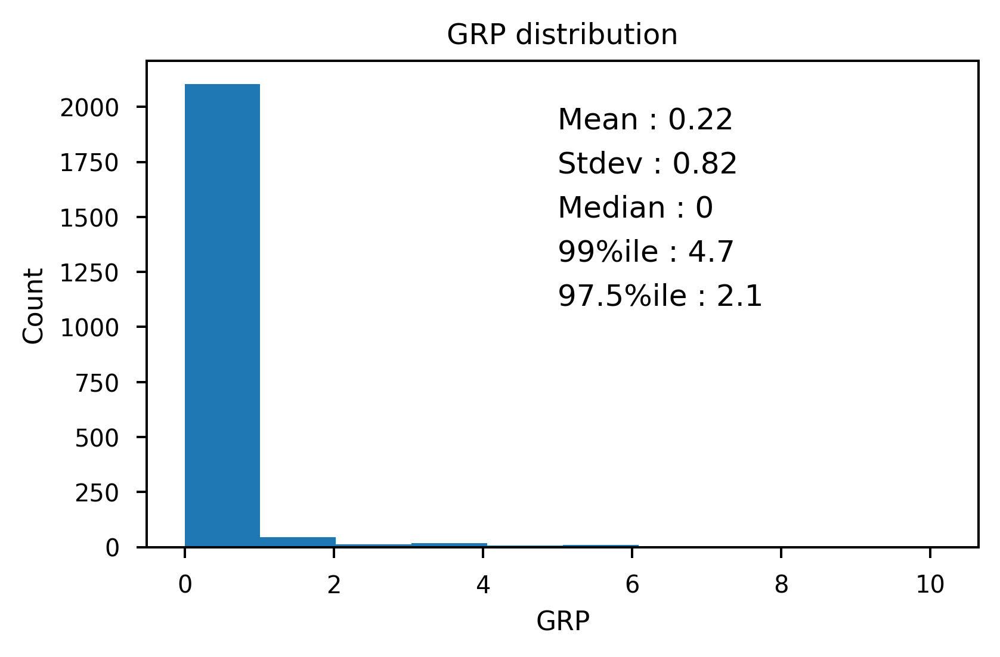

In [18]:
plt.rcParams['figure.figsize'] =  (5, 3)
plt.hist(data_spots['GRP'], bins=10)
plt.text(5, 1100, '97.5%ile : {:.2g}'.format(data_spots['GRP'].quantile(0.975)))
plt.text(5, 1300, '99%ile : {:.2g}'.format(data_spots['GRP'].quantile(0.99)))
plt.text(5, 1500, 'Median : {:.2g}'.format(data_spots['GRP'].median()))
plt.text(5, 1700, 'Stdev : {:.2g}'.format(data_spots['GRP'].std()))
plt.text(5, 1900, 'Mean : {:.2g}'.format(data_spots['GRP'].mean()))
plt.title('GRP distribution')
plt.xlabel('GRP')
plt.ylabel('Count')

plt.show();

Based on distribution I will bin `GRP` into 5 distinct categories `0`, `(0,1]`, `(1,2]`, `(2-5]`, `>5`

In [19]:
def GRP_binnes(GRP):
    if GRP == 0:
        return '0'
    elif GRP >0 and GRP <=1:
        return '0-1'
    elif GRP >1 and GRP <=2:
        return '1-2'
    elif GRP >2 and GRP <=5:
        return '2-5'
    else:
        return '>5'

In [20]:
data_spots['GRP_binned'] = data_spots['GRP'].apply(GRP_binnes)

### Number of spots displayed per each `Campaign Channel`

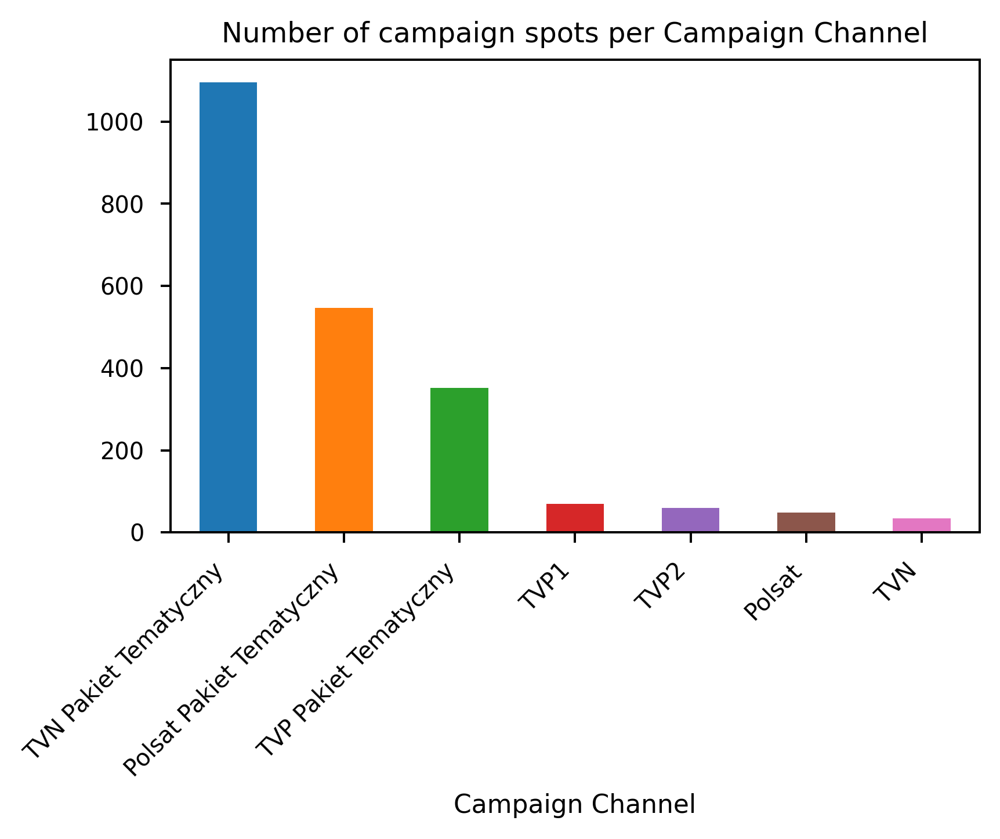

In [21]:
plt.rcParams['figure.figsize'] =  (5, 3)
data_spots.groupby(['Campaign Channel']).size().sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Number of campaign spots per Campaign Channel')
plt.show();

### Number of spots displayed per each day

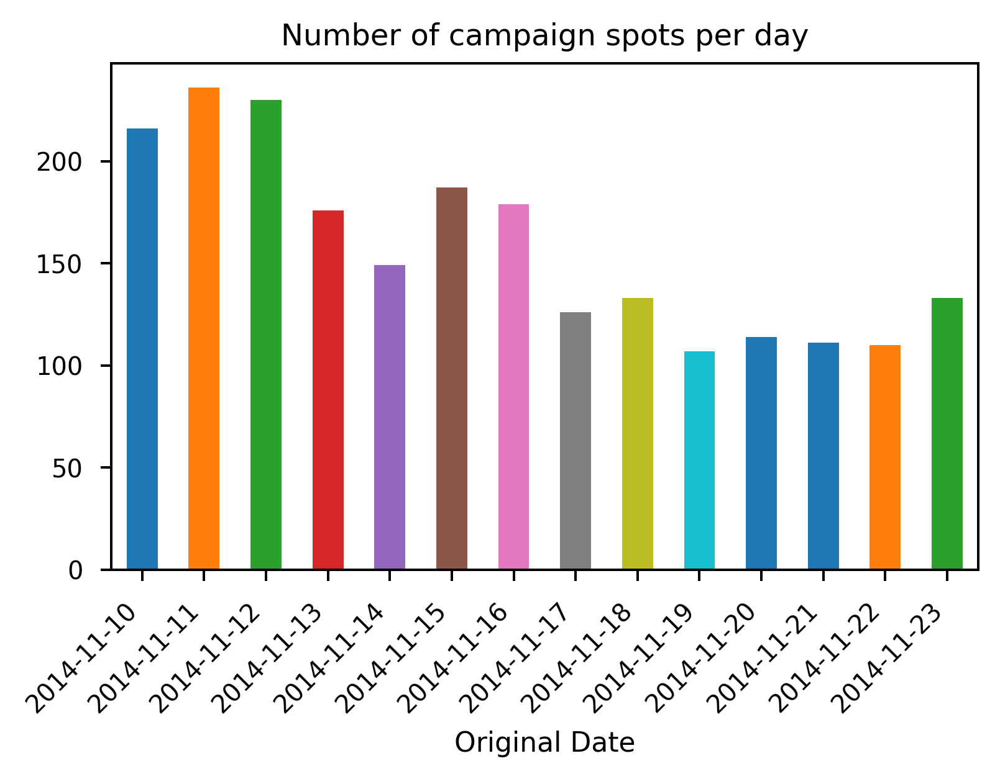

In [22]:
plt.rcParams['figure.figsize'] =  (5, 3)
data_spots.groupby(['Original Date']).size().rename(lambda date: date.strftime('%Y-%m-%d')).plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Number of campaign spots per day')
plt.show();

### Number of spots displayed per each `BreakType (Block type)`

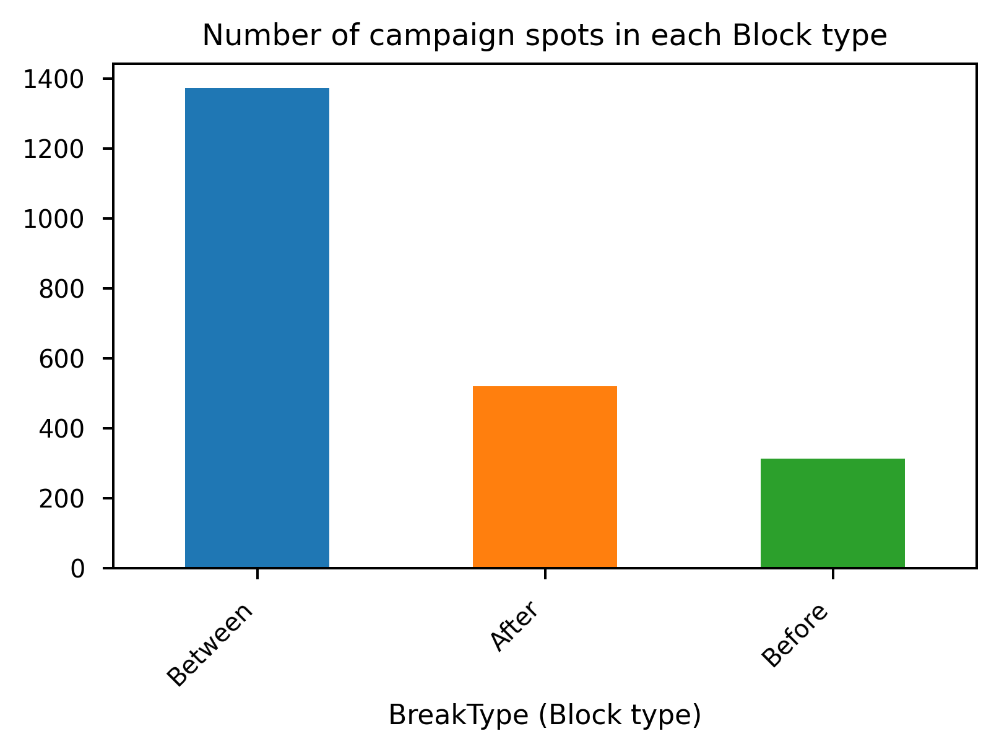

In [23]:
data_spots.groupby(['BreakType (Block type)']).size().sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Number of campaign spots in each Block type')
plt.show();

### Number of spots displayed per each `Timeband`

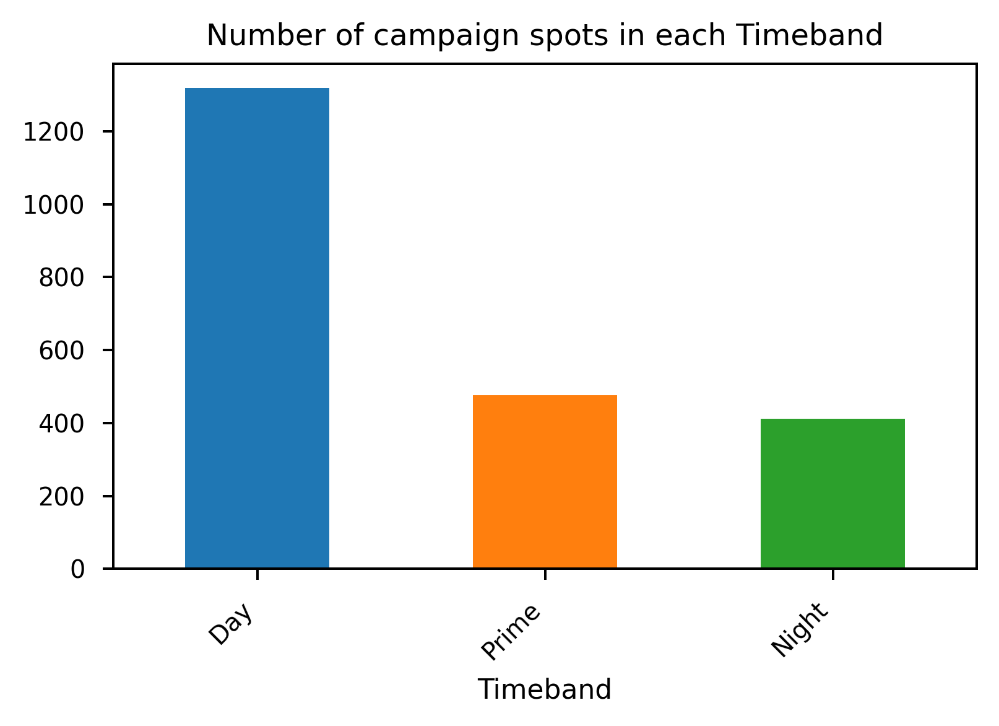

In [24]:
data_spots.groupby(['Timeband']).size().sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Number of campaign spots in each Timeband')
plt.show();

### Number of spots displayed per each `Position Type in the block of commercials`

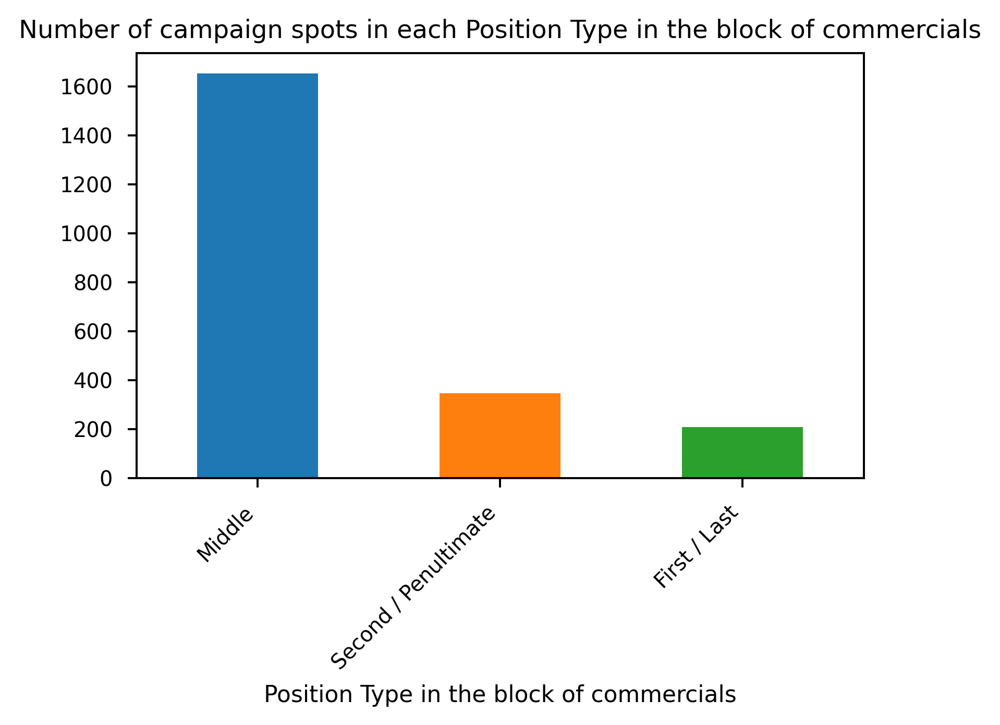

In [25]:
data_spots.groupby(['Position Type in the block of commercials']).size().sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Number of campaign spots in each Position Type in the block of commercials')
plt.show();

### Number of spots displayed per each `AGB Channel`

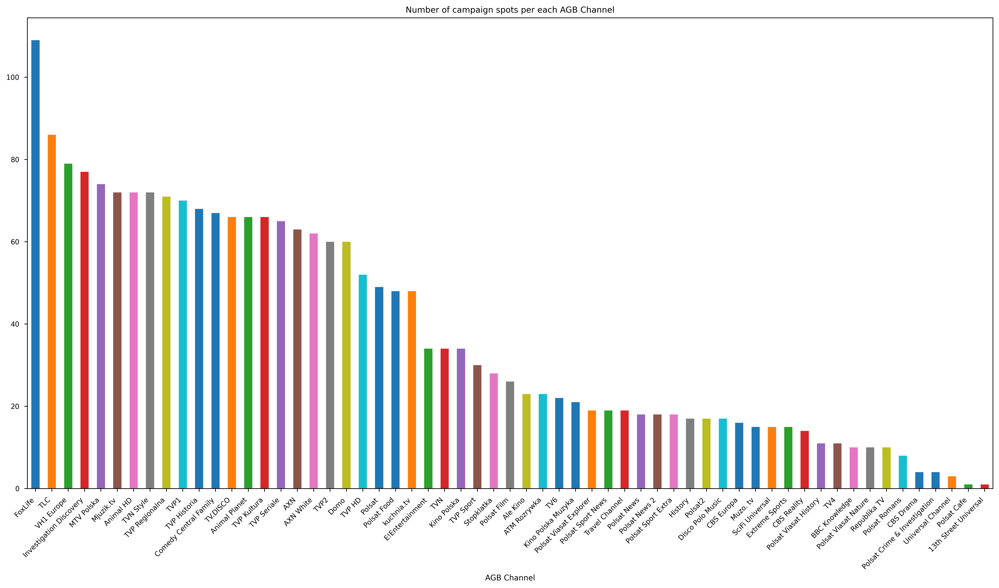

In [26]:
plt.figure(figsize=(20,10))
data_spots.groupby(['AGB Channel']).size().sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Number of campaign spots per each AGB Channel')
plt.show();

## Extract time features from datasets

In [27]:
data_visits['Date Time'] = data_visits['Date'] + pd.to_timedelta(data_visits['Hour'], unit='h')
data_visits['Week of year'] = data_visits['Date'].dt.weekofyear
data_visits['Day of week'] = data_visits['Date'].dt.dayofweek
data_visits['Hours since Monday 00:00'] = data_visits.apply(lambda row: row['Day of week'] * 24 + row['Hour'], axis=1)

In [28]:
data_spots['Original Title'] = data_spots['Title']
data_spots['Date Time'] = data_spots['Original Date'] + pd.to_timedelta(data_spots['Original Time'])
data_spots['Date'] = pd.to_datetime(data_spots['Date Time'].dt.date)
data_spots['Time'] = data_spots['Date Time'].dt.time
data_spots['Week of year'] = data_spots['Date Time'].dt.weekofyear
data_spots['Day of week'] = data_spots['Date Time'].dt.dayofweek
data_spots['Hour'] = data_spots['Date Time'].dt.hour
data_spots['Date Time Hour'] = data_spots['Date'] + pd.to_timedelta(data_spots['Hour'], unit='h')

### Plot website visits and vertical lines representing start and end of the campaign

In [29]:
campaign_start = data_spots['Date Time'].min()
campaign_end = data_spots['Date Time'].max()
christmas = pd.to_datetime('2014-12-20')

`2014-12-20` is the last Saturday before Christmas

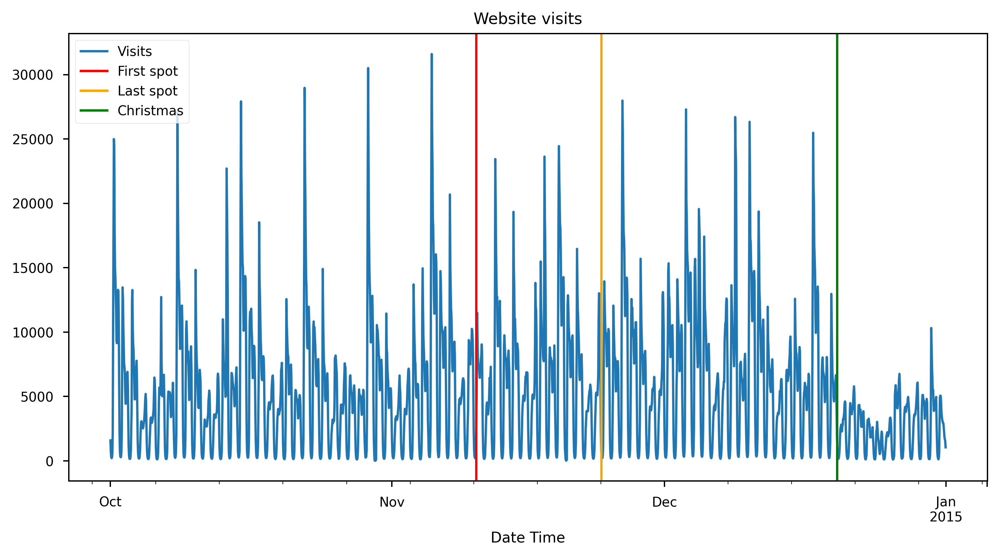

In [30]:
plt.rcParams['figure.figsize'] =  (10, 5)
ax = data_visits.set_index('Date Time').plot(y='Visits')

ax.axvline(campaign_start, color='red', label='First spot')
ax.axvline(campaign_end, color='orange', label='Last spot')
ax.axvline(christmas, color='green', label='Christmas')
plt.title('Website visits')
plt.legend(loc='upper left')

plt.show();

### Assign periods (`Pre_Campaign`, `Campaign`, `Post_Campaign`, `Christmas`)

In [31]:
def assign_period(dateTime):
    if dateTime >= christmas:
        return 'Christmas'
    if dateTime < campaign_start:
        return 'Pre-Campaign'
    if dateTime > campaign_end:
        return 'Post-Campaign'
    return 'Campaign'
    
data_visits['Period'] = data_visits['Date Time'].apply(assign_period)

In [32]:
data_visits.head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period
0,2014-10-01,0,1589,2014-10-01 00:00:00,40,2,48,Pre-Campaign
1,2014-10-01,1,658,2014-10-01 01:00:00,40,2,49,Pre-Campaign
2,2014-10-01,2,299,2014-10-01 02:00:00,40,2,50,Pre-Campaign
3,2014-10-01,3,211,2014-10-01 03:00:00,40,2,51,Pre-Campaign
4,2014-10-01,4,257,2014-10-01 04:00:00,40,2,52,Pre-Campaign


In [33]:
period_colors={
    'Campaign': tab10_colors[0],
    'Pre-Campaign': tab10_colors[1],
    'Post-Campaign': tab10_colors[8],
    'Christmas': tab10_colors[2],
    'baseline': tab10_colors[3]
}

## Baseline

Website visits datails collected in hourly slots which does not give us enough information to build a baseline based on window before and after TV spot displayed.

Baseline is going to be calculated based on website visits in previous weeks before campaign (`Pre-Campaign` period).

The website visits after the campaign (`Post-Campaign`) can be affected by the campaign, so they are not used in the baseline.

The number of visits after `2014-12-20` is much lower than previous periods.

In [34]:
data_visits.head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period
0,2014-10-01,0,1589,2014-10-01 00:00:00,40,2,48,Pre-Campaign
1,2014-10-01,1,658,2014-10-01 01:00:00,40,2,49,Pre-Campaign
2,2014-10-01,2,299,2014-10-01 02:00:00,40,2,50,Pre-Campaign
3,2014-10-01,3,211,2014-10-01 03:00:00,40,2,51,Pre-Campaign
4,2014-10-01,4,257,2014-10-01 04:00:00,40,2,52,Pre-Campaign


In [35]:
data_visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2208 entries, 0 to 2207
Data columns (total 8 columns):
Date                        2208 non-null datetime64[ns]
Hour                        2208 non-null int64
Visits                      2208 non-null int64
Date Time                   2208 non-null datetime64[ns]
Week of year                2208 non-null int64
Day of week                 2208 non-null int64
Hours since Monday 00:00    2208 non-null int64
Period                      2208 non-null object
dtypes: datetime64[ns](2), int64(5), object(1)
memory usage: 138.1+ KB


### All visits by period

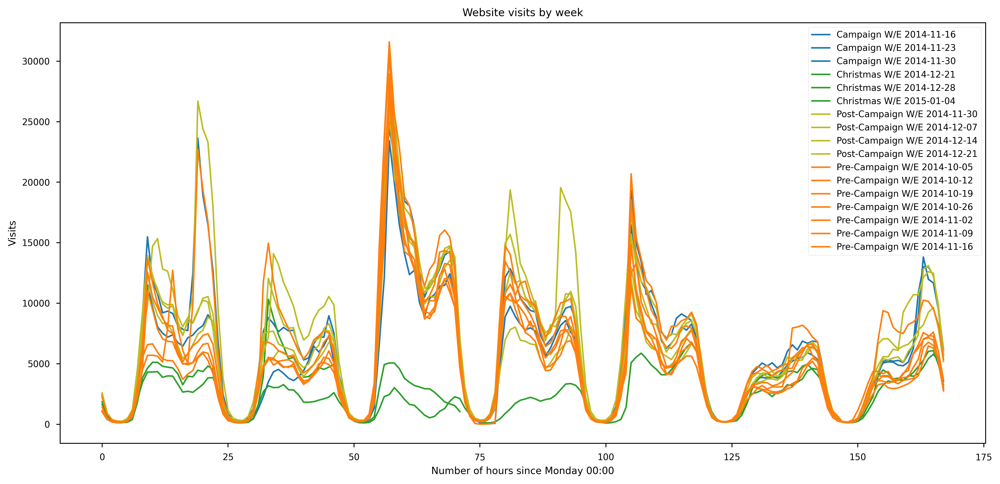

In [171]:
plt.rcParams['figure.figsize'] =  (15, 7)

for period_name, period_df in data_visits.groupby(['Period']):
    for week_end, week_df in period_df.groupby(pd.Grouper(key='Date',freq='W')):
        plt.plot(week_df['Hours since Monday 00:00'], week_df['Visits'], label=period_name + ' W/E ' + str(week_end.date()), 
                 color=period_colors[period_name])

plt.xlabel('Number of hours since Monday 00:00')
plt.ylabel('Visits')
plt.title('Website visits by week')
plt.legend()

plt.show();

### Mean visits by hour in all periods

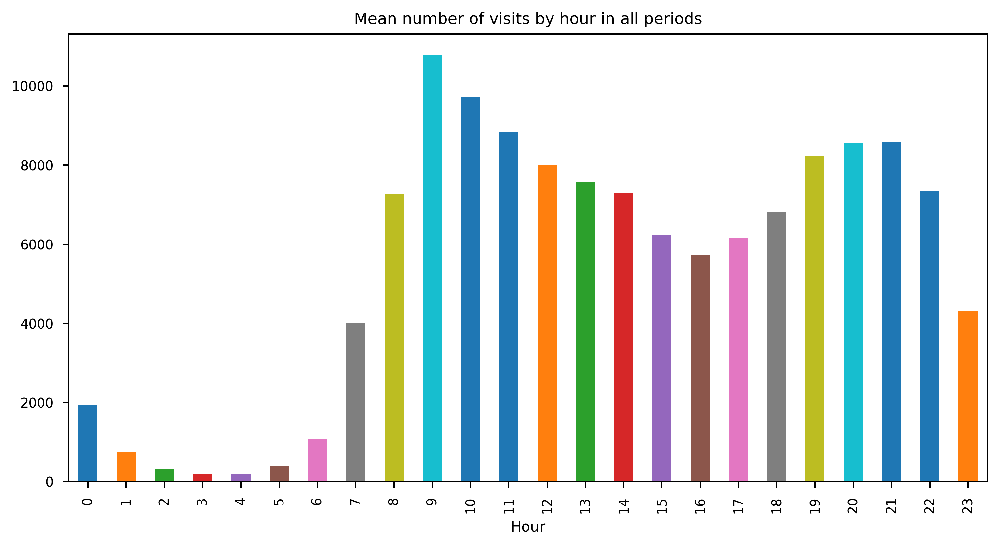

In [37]:
plt.figure(figsize=(10, 5))
data_visits.groupby('Hour')['Visits'].mean().plot(kind='bar')
plt.title('Mean number of visits by hour in all periods')

plt.show();

In [38]:
def bin_hours(hour):
    if (hour < 7):
        return 'Night'
    if (hour <= 11):
        return 'Morning'
    if (hour < 18):
        return 'Day'
    if (hour <= 22):
        return 'Evening'
    return 'Night'
    
data_visits['Hour_bin'] = data_visits.Hour.apply(bin_hours)

### Mean number of visits by time of the day for each period of campaign

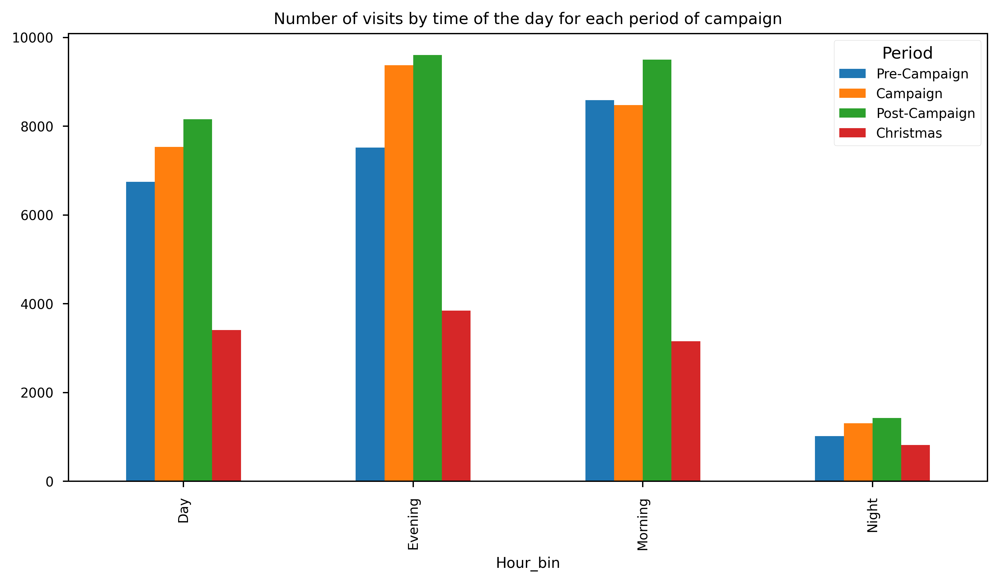

In [39]:
plt.rcParams['figure.figsize'] =  (10, 5)
data_visits.groupby(['Hour_bin', 'Period']).mean()['Visits'].unstack()[['Pre-Campaign', 'Campaign', 'Post-Campaign', 'Christmas']].plot(kind='bar')
plt.title('Number of visits by time of the day for each period of campaign')
plt.show();

### Percentage change in website visits for `Pre-Campaign`,  `Campaign`, `Post-Campaign`

In [40]:
mean_visits_per_period = data_visits[data_visits.Period != 'Christmas'].groupby(['Period'])['Visits'].mean().sort_values().reset_index()
mean_visits_per_period['pct_change'] = (mean_visits_per_period['Visits'].pct_change().fillna(1)*100).round()
mean_visits_per_period

,Period,Visits,pct_change
0,Pre-Campaign,5352.383661,100.0
1,Campaign,6111.039275,14.0
2,Post-Campaign,6511.299035,7.0


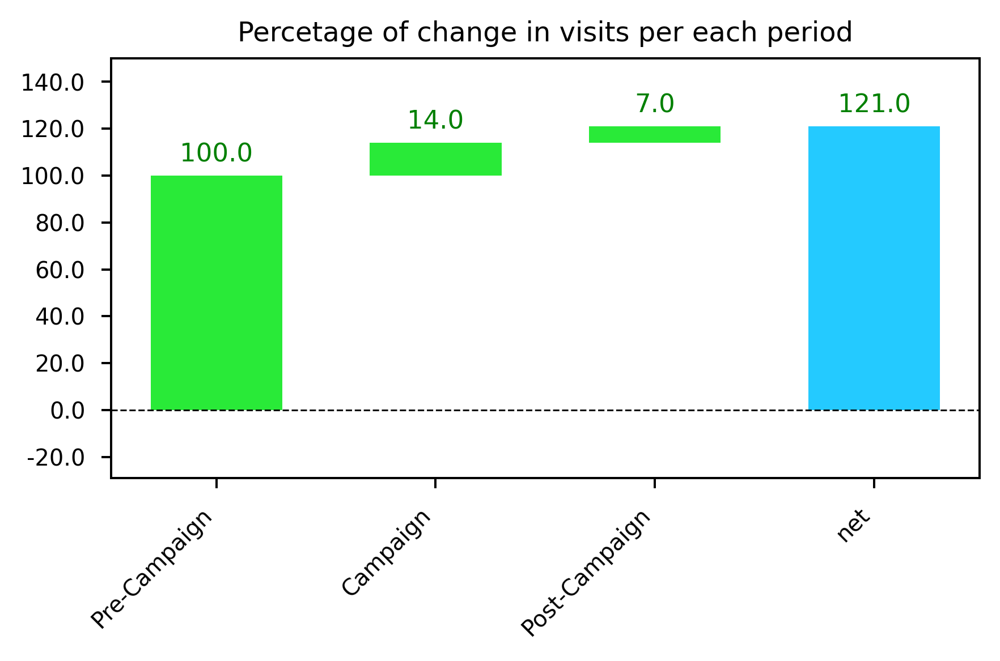

In [41]:
import waterfall_chart
plt.rcParams['figure.figsize'] =  (5, 3)
waterfall_chart.plot(mean_visits_per_period['Period'], mean_visits_per_period['pct_change'])
plt.xticks(rotation=45, ha='right')
    
plt.title('Percetage of change in visits per each period')
plt.show();

### Number of visits change week by week

In [42]:
mean_visits_per_week = data_visits[data_visits.Period != 'Christmas'].groupby(['Week of year'])['Visits'].median().reset_index().sort_values(by='Week of year')
mean_visits_per_week['pct_change'] = mean_visits_per_week['Visits'].diff().fillna(3457.5)

mean_visits_per_week

,Week of year,Visits,pct_change
0,40,3457.5,3457.5
1,41,4084.5,627.0
2,42,4956.0,871.5
3,43,4596.0,-360.0
4,44,4206.5,-389.5
5,45,5995.0,1788.5
6,46,5134.0,-861.0
7,47,5851.5,717.5
8,48,5940.5,89.0
9,49,7014.5,1074.0


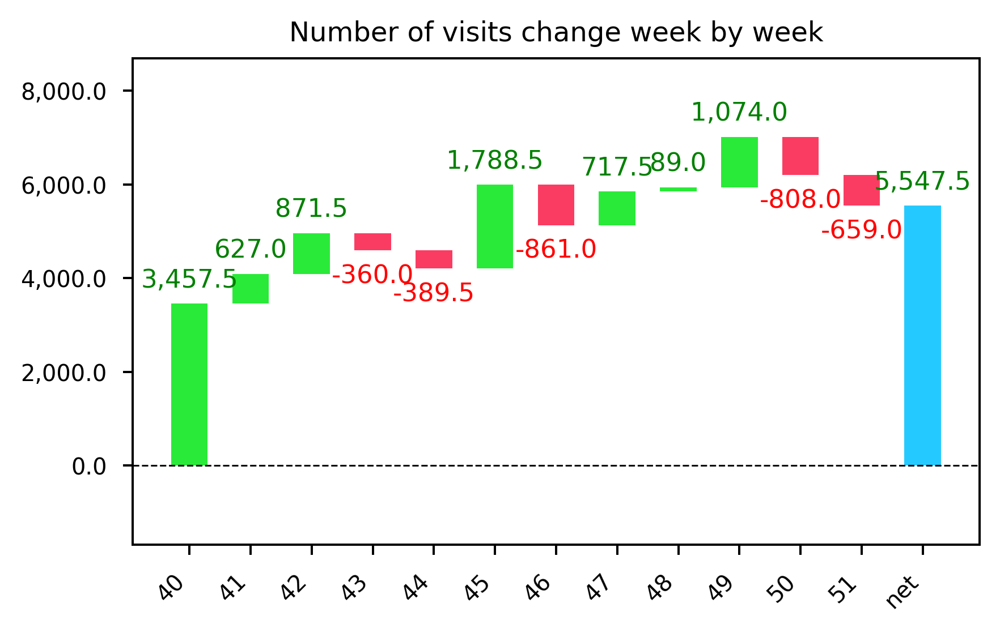

In [43]:
plt.rcParams['figure.figsize'] =  (5, 3)
waterfall_chart.plot(mean_visits_per_week['Week of year'], mean_visits_per_week['pct_change'])
plt.xticks(rotation=45, ha='right')
    
plt.title('Number of visits change week by week')
plt.show();

### Mean number of visits by period

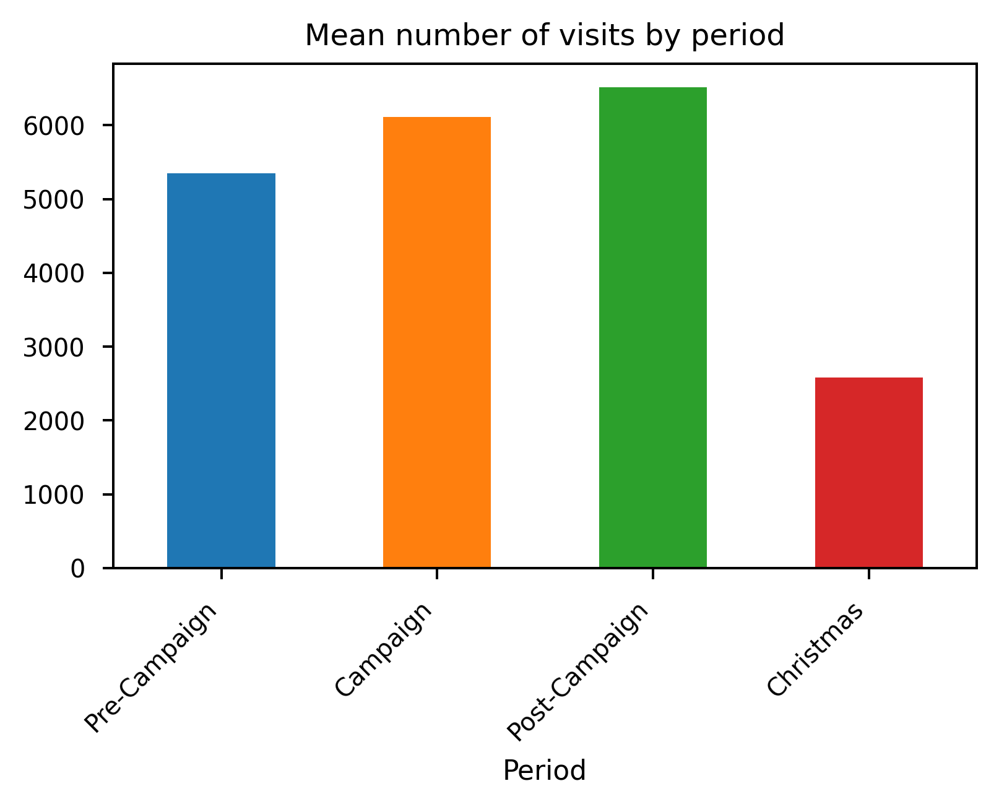

In [44]:
plt.rcParams['figure.figsize'] =  (5, 3)
data_visits.groupby('Period').mean()['Visits'].sort_values()[['Pre-Campaign', 'Campaign', 'Post-Campaign', 'Christmas']].plot(kind='bar')
plt.xticks(rotation=45, ha='right')
plt.title('Mean number of visits by period')

plt.show()

### Pre-Campaign visits

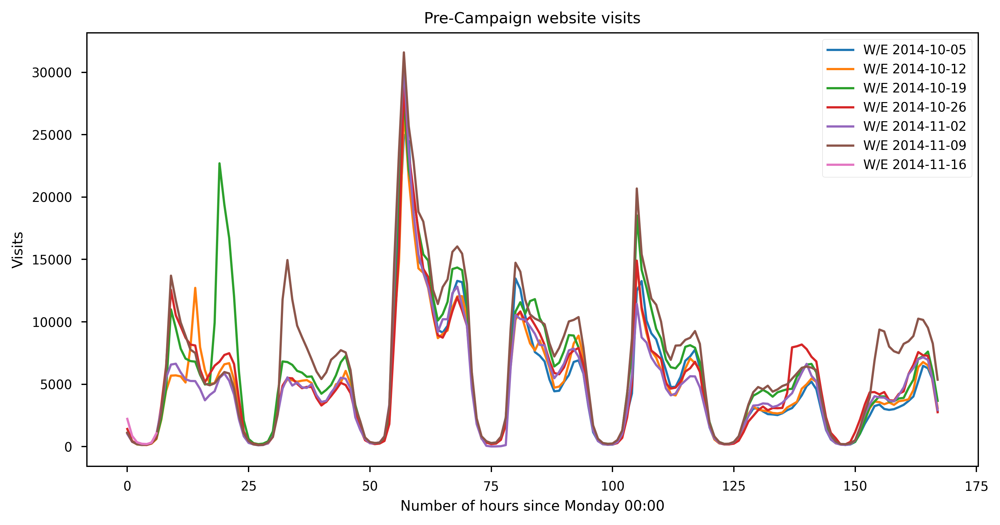

In [45]:
plt.rcParams['figure.figsize'] =  (10, 5)

color_index = 0
for week_end, week_df in data_visits[data_visits['Period'] == 'Pre-Campaign'].groupby(pd.Grouper(key='Date Time',freq='W')):
    plt.plot(week_df['Hours since Monday 00:00'], week_df['Visits'], label='W/E ' + str(week_end.date()), 
             color=tab10_colors[color_index])
    color_index += 1
    
plt.xlabel('Number of hours since Monday 00:00')
plt.ylabel('Visits')   
plt.title('Pre-Campaign website visits')
plt.legend(bbox_to_anchor=[1, 1])

plt.show();

### Baseline extraction

I calculate `median` for each day and hour of the `Pre-Campaign` visits to minimise influence of outliers on the baseline.

In [46]:
baseline = data_visits[data_visits['Period'] == 'Pre-Campaign'].groupby('Hours since Monday 00:00')['Visits'].median().reset_index().rename(columns={'Visits': 'Baseline visits'})

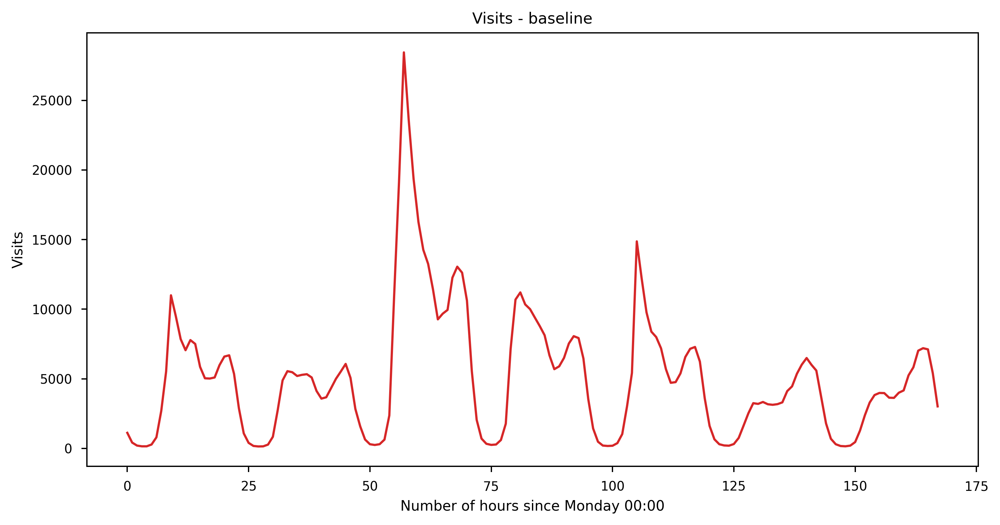

In [47]:
baseline['Baseline visits'].plot(color=period_colors['baseline'])
plt.xlabel('Number of hours since Monday 00:00')
plt.ylabel('Visits')   
plt.title('Visits - baseline')

plt.show()

### Compare `Pre-Campaign` period with baseline

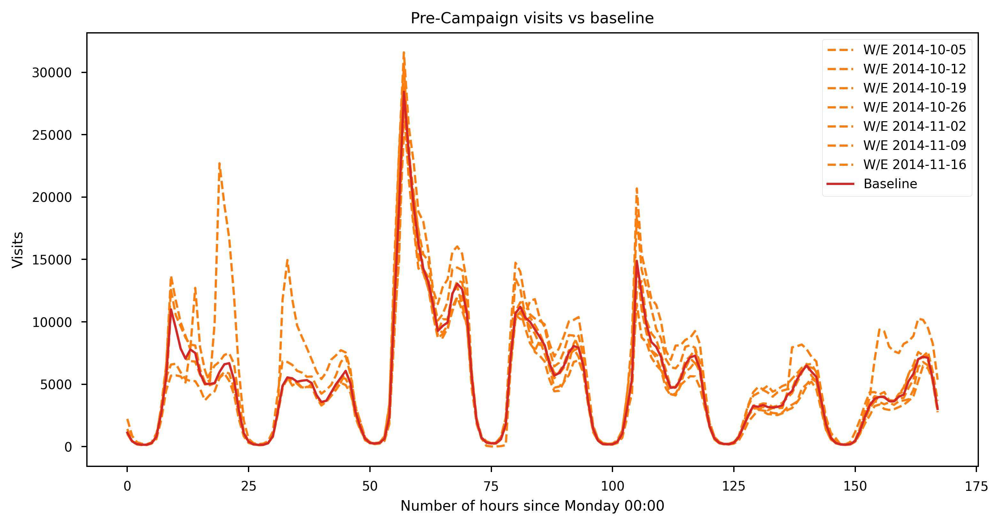

In [48]:
for week_end, week_df in data_visits[(data_visits['Period'] == 'Pre-Campaign')].groupby(pd.Grouper(key='Date Time',freq='W')):
    plt.plot(week_df['Hours since Monday 00:00'], week_df['Visits'], label='W/E ' + str(week_end.date()), 
             color=period_colors['Pre-Campaign'], linestyle='dashed')

plt.plot(baseline['Hours since Monday 00:00'], baseline['Baseline visits'], label='Baseline', color=period_colors['baseline'])

plt.xlabel('Number of hours since Monday 00:00')
plt.ylabel('Visits')   
plt.title('Pre-Campaign visits vs baseline')
plt.legend(bbox_to_anchor=[1, 1])

plt.show();

### Compare `Campaign`  and `Post-Campaign` periods with baseline

In [49]:
def compare_period_with_baseline_plot(periods):
    for period_name, period_df in data_visits[data_visits['Period'].isin(periods)].groupby(['Period']):
        for week_end, week_df in period_df.groupby(pd.Grouper(key='Date Time',freq='W')):
            plt.plot(week_df['Hours since Monday 00:00'], week_df['Visits'], label=period_name + ' W/E ' + str(week_end.date()), 
                     color=period_colors[period_name], linestyle='dashed')

    plt.plot(baseline['Hours since Monday 00:00'], baseline['Baseline visits'], label='Baseline', color=period_colors['baseline'])

    plt.xlabel('Number of hours since Monday 00:00')
    plt.ylabel('Visits')   
    plt.title(str(periods) + ' visits vs baseline')
    plt.legend(bbox_to_anchor=[1, 1])

    plt.show();

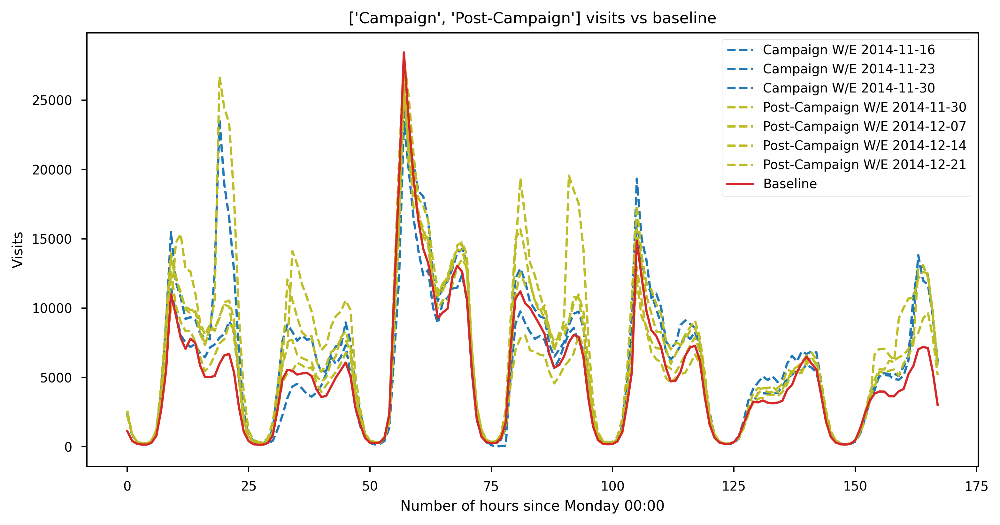

In [50]:
compare_period_with_baseline_plot(['Campaign', 'Post-Campaign'])

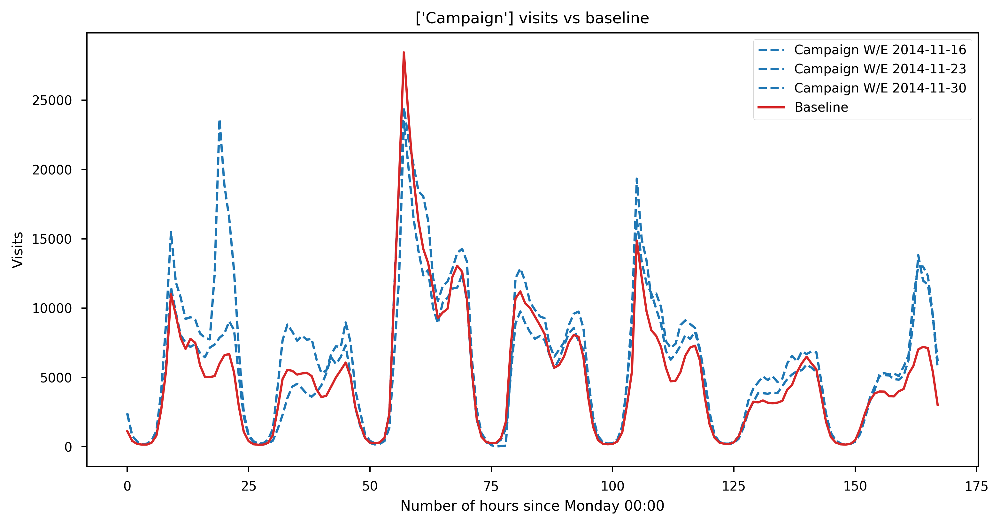

In [51]:
compare_period_with_baseline_plot(['Campaign'])

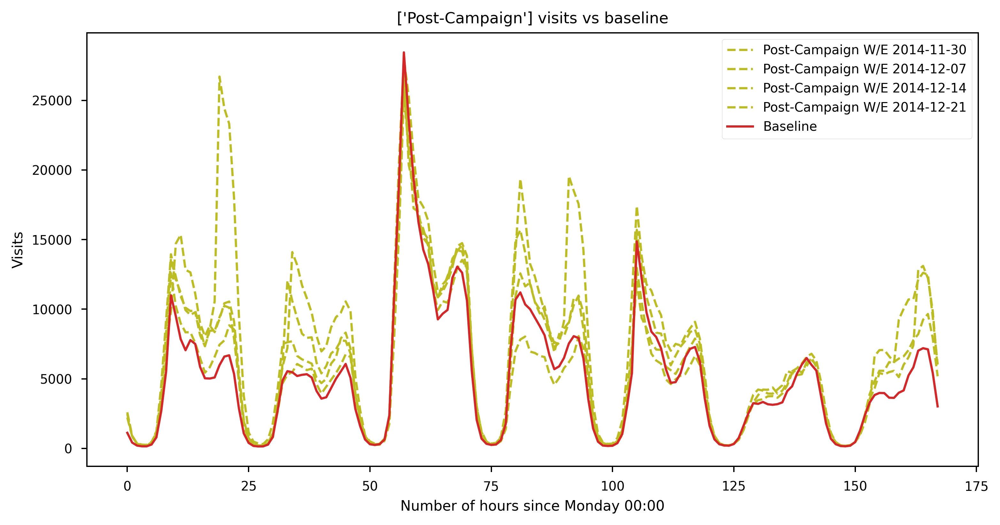

In [52]:
compare_period_with_baseline_plot(['Post-Campaign'])

## Compute difference between `Visits` and `Baseline Visits`

In [53]:
data_visits_baseline = data_visits.merge(baseline, on='Hours since Monday 00:00')

In [54]:
data_visits_baseline['Diff from baseline'] = data_visits_baseline['Visits'] - data_visits_baseline['Baseline visits']

In [55]:
data_visits_baseline.head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period,Hour_bin,Baseline visits,Diff from baseline
0,2014-10-01,0,1589,2014-10-01,40,2,48,Pre-Campaign,Night,1582.5,6.5
1,2014-10-08,0,1576,2014-10-08,41,2,48,Pre-Campaign,Night,1582.5,-6.5
2,2014-10-15,0,1979,2014-10-15,42,2,48,Pre-Campaign,Night,1582.5,396.5
3,2014-10-22,0,1426,2014-10-22,43,2,48,Pre-Campaign,Night,1582.5,-156.5
4,2014-10-29,0,1343,2014-10-29,44,2,48,Pre-Campaign,Night,1582.5,-239.5


In [56]:
data_visits_baseline[data_visits_baseline['Period'] == 'Pre-Campaign'].sort_values('Diff from baseline', ascending=False).head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period,Hour_bin,Baseline visits,Diff from baseline
1832,2014-10-13,19,22705,2014-10-13 19:00:00,42,0,19,Pre-Campaign,Evening,5978.0,16727.0
1845,2014-10-13,20,19397,2014-10-13 20:00:00,42,0,20,Pre-Campaign,Evening,6594.0,12803.0
1858,2014-10-13,21,16714,2014-10-13 21:00:00,42,0,21,Pre-Campaign,Evening,6685.0,10029.0
2017,2014-11-04,9,14952,2014-11-04 09:00:00,45,1,33,Pre-Campaign,Morning,5546.0,9406.0
2004,2014-11-04,8,11788,2014-11-04 08:00:00,45,1,32,Pre-Campaign,Morning,4883.0,6905.0


In [57]:
data_visits_baseline['Diff from baseline %'] = (data_visits_baseline['Diff from baseline'] / data_visits_baseline['Baseline visits']) * 100

In [58]:
data_visits_baseline.head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period,Hour_bin,Baseline visits,Diff from baseline,Diff from baseline %
0,2014-10-01,0,1589,2014-10-01,40,2,48,Pre-Campaign,Night,1582.5,6.5,0.410742
1,2014-10-08,0,1576,2014-10-08,41,2,48,Pre-Campaign,Night,1582.5,-6.5,-0.410742
2,2014-10-15,0,1979,2014-10-15,42,2,48,Pre-Campaign,Night,1582.5,396.5,25.055292
3,2014-10-22,0,1426,2014-10-22,43,2,48,Pre-Campaign,Night,1582.5,-156.5,-9.889415
4,2014-10-29,0,1343,2014-10-29,44,2,48,Pre-Campaign,Night,1582.5,-239.5,-15.134281


In [59]:
data_visits_baseline[data_visits_baseline['Period'] == 'Pre-Campaign'].sort_values('Diff from baseline %', ascending=False).head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period,Hour_bin,Baseline visits,Diff from baseline,Diff from baseline %
1832,2014-10-13,19,22705,2014-10-13 19:00:00,42,0,19,Pre-Campaign,Evening,5978.0,16727.0,279.809301
1845,2014-10-13,20,19397,2014-10-13 20:00:00,42,0,20,Pre-Campaign,Evening,6594.0,12803.0,194.161359
2017,2014-11-04,9,14952,2014-11-04 09:00:00,45,1,33,Pre-Campaign,Morning,5546.0,9406.0,169.599712
1353,2014-10-26,6,1163,2014-10-26 06:00:00,43,6,150,Pre-Campaign,Night,452.0,711.0,157.300885
1858,2014-10-13,21,16714,2014-10-13 21:00:00,42,0,21,Pre-Campaign,Evening,6685.0,10029.0,150.022438


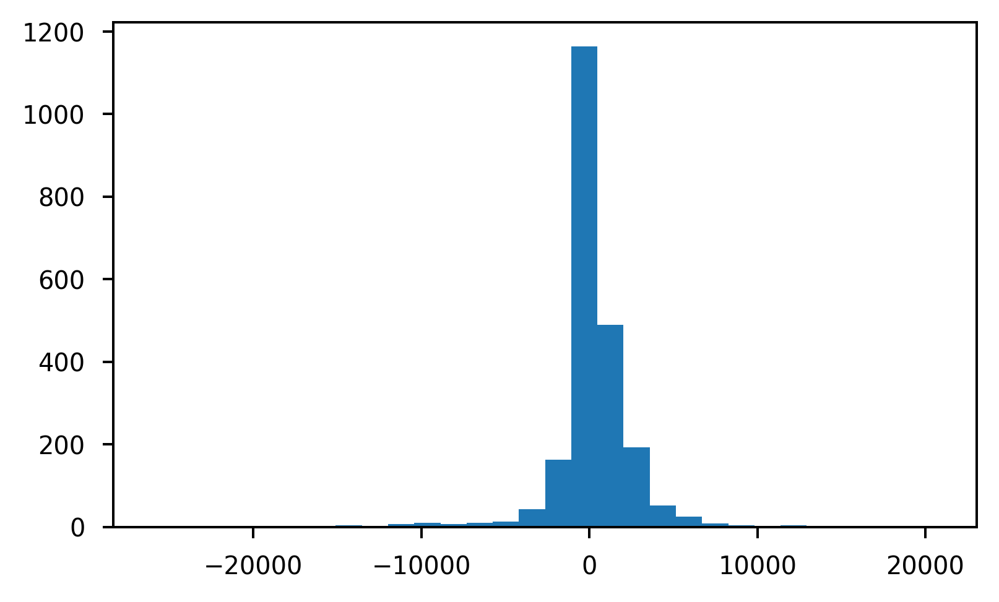

In [60]:
plt.rcParams['figure.figsize'] =  (5, 3)

data_visits_baseline['Diff from baseline'].hist(bins = 30)
plt.grid(False);

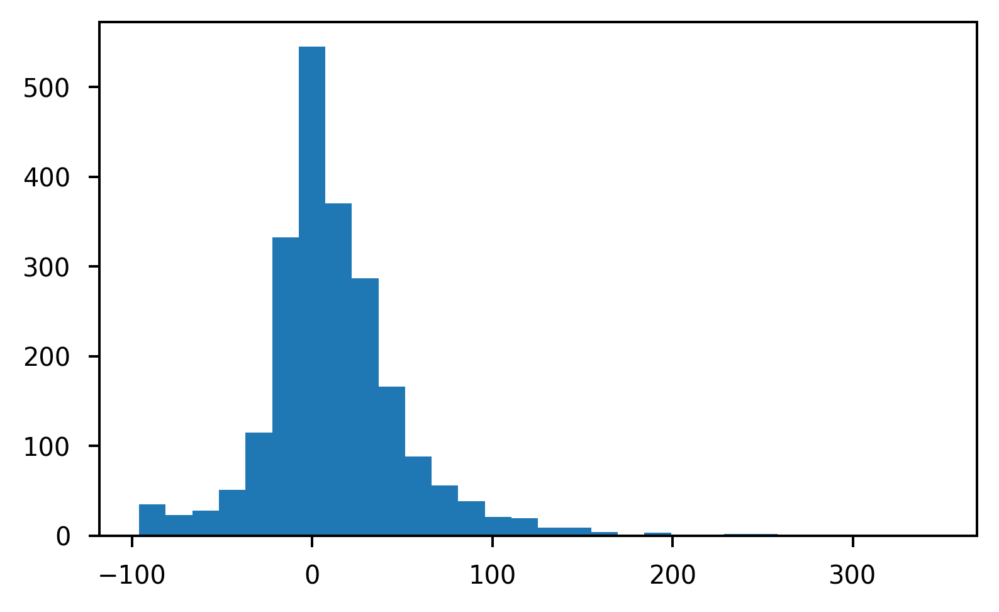

In [61]:
data_visits_baseline['Diff from baseline %'].hist(bins = 30)
plt.grid(False);

### Assign bins to `Diff from baseline`

`Diff from baseline` is devided into 4 distinct classes

In [62]:
diff_class = {
    '<0': 0,
    '>0': 1,
    '>50': 2,
    '>100': 3
}
def bin_diff_percentage(diff, diff_percentage):
    if diff_percentage < 0:
        return '<0'
    if diff_percentage > 100 and diff > 1000:
        return '>100'
    if diff_percentage > 50 and diff > 1000: 
        return '>50'
    return '>0'

data_visits_baseline['Diff from baseline bin'] = data_visits_baseline.apply(lambda row: bin_diff_percentage(row['Diff from baseline'], row['Diff from baseline %']), axis=1)
data_visits_baseline['Diff from baseline bin class'] = data_visits_baseline.apply(lambda row: diff_class[row['Diff from baseline bin']], axis=1)

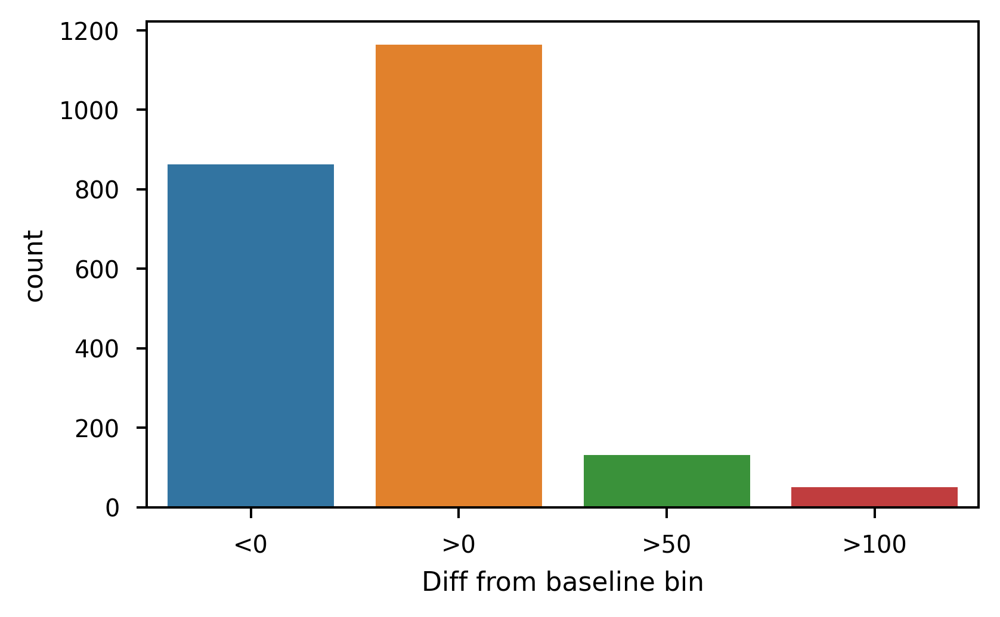

In [63]:
plt.rcParams['figure.figsize'] =  (5, 3)
sns.countplot(data_visits_baseline['Diff from baseline bin'], order=['<0', '>0', '>50', '>100']);

### Plot difference from baseline

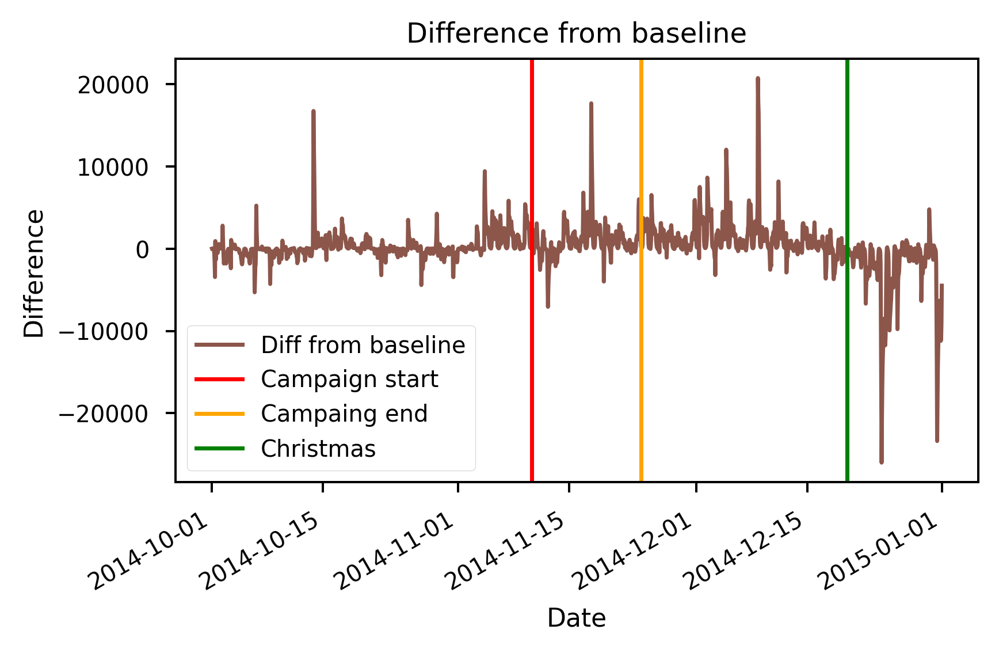

In [64]:
ax = data_visits_baseline.set_index('Date Time').plot(y='Diff from baseline', color=tab10_colors[5])
ax.axvline(campaign_start, color='red', label='Campaign start')
ax.axvline(campaign_end, color='orange', label='Campaing end')
ax.axvline(christmas, color='green', label='Christmas')
plt.xlabel('Date')
plt.ylabel('Difference')   
plt.title('Difference from baseline')
plt.legend()
plt.show()

### Plot website visits in `Campaign` period and number of spots in the same window time

In [65]:
data_visits_baseline.head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period,Hour_bin,Baseline visits,Diff from baseline,Diff from baseline %,Diff from baseline bin,Diff from baseline bin class
0,2014-10-01,0,1589,2014-10-01,40,2,48,Pre-Campaign,Night,1582.5,6.5,0.410742,>0,1
1,2014-10-08,0,1576,2014-10-08,41,2,48,Pre-Campaign,Night,1582.5,-6.5,-0.410742,<0,0
2,2014-10-15,0,1979,2014-10-15,42,2,48,Pre-Campaign,Night,1582.5,396.5,25.055292,>0,1
3,2014-10-22,0,1426,2014-10-22,43,2,48,Pre-Campaign,Night,1582.5,-156.5,-9.889415,<0,0
4,2014-10-29,0,1343,2014-10-29,44,2,48,Pre-Campaign,Night,1582.5,-239.5,-15.134281,<0,0


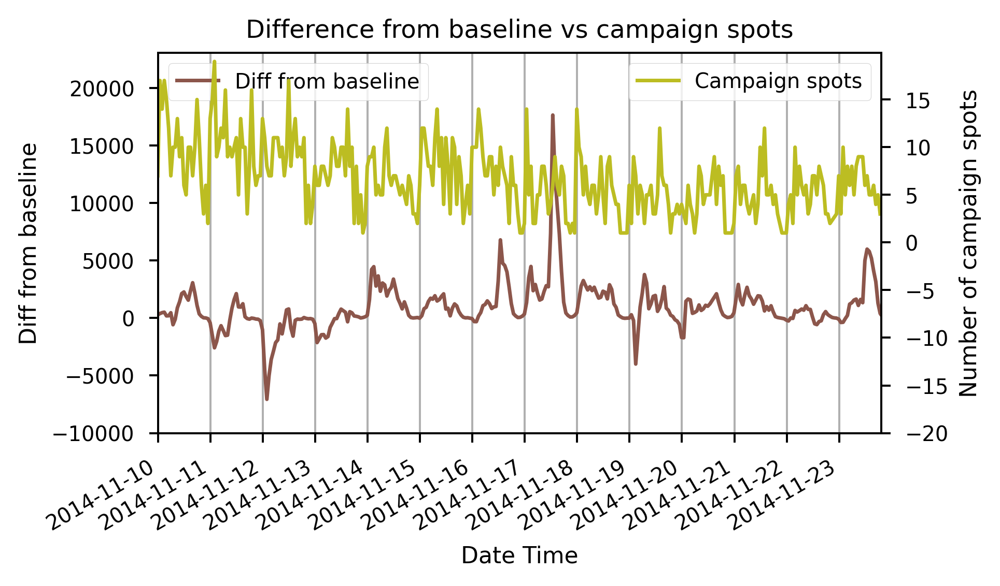

In [66]:
ax1 = data_visits_baseline.set_index('Date Time').plot(y='Diff from baseline', color=tab10_colors[5])
ax2 = ax1.twinx()
data_spots.groupby('Date Time Hour')['Campaign Channel'].count().plot(ax=ax2, color=tab10_colors[8], label='Campaign spots')

ax1.set_xlim(campaign_start, campaign_end)
ax1.set_ylim(-10000)
ax2.set_ylim(-20)
#ax.xaxis.set_major_locator('Date Time')
ax1.set_ylabel('Diff from baseline')
ax2.set_ylabel('Number of campaign spots')
plt.title('Difference from baseline vs campaign spots')
ax1.legend(loc=2)
ax2.legend(loc=0)
ax1.grid(True, axis='x', which='both')
plt.xticks(np.arange(campaign_start, campaign_end, pd.to_timedelta('1 day')))

plt.show();

## Model

### Feature engineering

#### Extracting a category from the title

I extract TV program type from the original title which contains: title, type and country.

The data needs cleanup.

In [67]:
countries_map = {
    'ANG': 'ANGLIA',
    'ARG': 'ARGENTYNA',
    'AUSTRALIA': 'AUSTRALIA',
    'AUSTRAL': 'AUSTRALIA',
    'AUSTRIA': 'AUSTRIA',
    'AUSTR': 'AUSTRIA',
    'AUS': 'AUSTRIA',
    'BULG': 'BULGARIA',
    'DAN': 'DANIA',
    'FRANC': 'FRANCJA',
    'FRAN': 'FRANCJA',
    'FRA': 'FRANCJA',
    'FR': 'FRANCJA',
    'GR': 'GRECJA',
    'HISZP': 'HISZPANIA',
    'HOL': 'HOLANDIA',
    'IRL': 'IRLANDIA',
    'IZRA': 'IZRAEL',
    'JAP': 'JAPONIA',
    'KANADA': 'KANADA',
    'KAN': 'KANADA',
    'NIEM': 'NIEMCY',
    'MEKS': 'MEKSYK',
    'NOR': 'NORWEGIA',
    'N.ZEL': 'NOWA ZELANDIA',
    'POLSKA': 'POLSKA',
    'POL': 'POLSKA',
    'ROS': 'ROSJA',
    'RPA': 'RPA',
    'RUM': 'RUMUNIA',
    'SZWE': 'SZWECJA',
    'TURCJA': 'TURCJA',
    'UKR': 'UKRAINA',
    'USA': 'USA',
    'WIELK.BRYT': 'WIELKA BRYTANIA',
    'WIEL.BRYT': 'WIELKA BRYTANIA',
    'WLK.BRYT': 'WIELKA BRYTANIA',
    'WKL.BRYT': 'WIELKA BRYTANIA',
    'W.BRYT': 'WIELKA BRYTANIA',
    'W. BRYT': 'WIELKA BRYTANIA',
    'WLOCHY': 'WLOCHY',
    'WLOCH': 'WLOCHY',
    'WLO': 'WLOCHY',
    'WL': 'WLOCHY'
}

replacement_map = {
    'PROGR ': 'PROGRAM ',
    'PROG ': 'PROGRAM ',
    'MAG ': 'MAGAZYN ',
    'SER ': 'SERIAL ',
    'TRANS ': 'TRANSMISJA ',
    'TRANSM ': 'TRANSMISJA '
}

def cleanup_type(type):
    if type is None:
        return [None, []]
    countries = []
    for short, name in countries_map.items():
        if "." + short in type or " " + short in type or "-" + short in type:
            type = type.replace(short, '')
            countries.append(name)
    
    type = re.sub('[. -]+', ' ', type)
    
    for short, name in replacement_map.items():
        type = type.replace(short, name)
    return [None if len(type.strip()) == 0 else type.strip(), countries]

In [68]:
data_spots[['Title', 'Type']] = data_spots['Original Title'].str.split('/', expand=True)[[0, 1]]

In [69]:
data_spots['Type'], data_spots['Countries'] = zip(*data_spots['Type'].apply(cleanup_type))

In [70]:
data_spots.head()

,Campaign Channel,AGB Channel,Original Date,Original Time,Timeband,BreakType (Block type),Title,Position Type in the block of commercials,GRP,GRP_binned,Original Title,Date Time,Date,Time,Week of year,Day of week,Hour,Date Time Hour,Type,Countries
0,TVN Pakiet Tematyczny,FoxLife,2014-11-10,06:10:25,Day,Between,ZONA DLA MILIONERA,Middle,0.0,0,ZONA DLA MILIONERA /PROG.ROZR.USA/,2014-11-10 06:10:25,2014-11-10,06:10:25,46,0,6,2014-11-10 06:00:00,PROGRAM ROZR,[USA]
1,TVP Pakiet Tematyczny,TVP Seriale,2014-11-10,06:11:50,Day,After,LOKATORZY,Middle,0.0,0,LOKATORZY /SER.KOM.POL./,2014-11-10 06:11:50,2014-11-10,06:11:50,46,0,6,2014-11-10 06:00:00,SERIAL KOM,[POLSKA]
2,TVN Pakiet Tematyczny,Mjuzik.tv,2014-11-10,06:12:59,Day,Between,TELEDYSKI,Middle,0.0,0,TELEDYSKI,2014-11-10 06:12:59,2014-11-10,06:12:59,46,0,6,2014-11-10 06:00:00,None,[]
3,TVN Pakiet Tematyczny,MTV Polska,2014-11-10,06:19:06,Day,Between,PIMP MY RIDE,Middle,0.0,0,PIMP MY RIDE,2014-11-10 06:19:06,2014-11-10,06:19:06,46,0,6,2014-11-10 06:00:00,None,[]
4,TVN Pakiet Tematyczny,Comedy Central Family,2014-11-10,06:42:34,Day,Between,DALEKO JESZCZE?,Middle,0.0,0,DALEKO JESZCZE? /SER.KOM.USA/,2014-11-10 06:42:34,2014-11-10,06:42:34,46,0,6,2014-11-10 06:00:00,SERIAL KOM,[USA]


After extracting types I assign a category to each type.

In [71]:
categories_for_type_map = {
    '90': 'MUZYKA',
    'ARCH SERWIS INFORMACYJNY': 'INFORMACJE',
    'BOKS': 'SPORT',
    'CYKL REP': 'REPORTAZ',
    'CYKL REPORTAZY': 'REPORTAZ',
    'DOK': 'REPORTAZ',
    'DRAM': 'FILM',
    'FILM': 'FILM',
    'FILM ANIM': 'DZIECI',
    'FILM ARCH': 'FILM',
    'FILM DOK': 'FILM',
    'FILM DRA': 'FILM',
    'FILM DRA KRYM': 'FILM',
    'FILM DRA OBYCZ': 'FILM',
    'FILM DRA WOJ': 'FILM',
    'FILM DRAM': 'FILM',
    'FILM DRAM BIOGR': 'FILM',
    'FILM DRAM OBYCZ': 'FILM',
    'FILM FAB': 'FILM',
    'FILM FAB DOK': 'FILM',
    'FILM FAM': 'FILM',
    'FILM FANT': 'FILM',
    'FILM HOR': 'FILM',
    'FILM HORR': 'FILM',
    'FILM KATAS': 'FILM',
    'FILM KATASTR': 'FILM',
    'FILM KOM': 'FILM',
    'FILM KOM KRYM': 'FILM',
    'FILM KOM SF': 'FILM',
    'FILM KROTKOM': 'FILM',
    'FILM MELOD': 'FILM',
    'FILM MELODRA': 'FILM',
    'FILM MLODZ': 'FILM',
    'FILM OBYCZ': 'FILM',
    'FILM PRZYG': 'FILM',
    'FILM S F': 'FILM',
    'FILM SENS': 'FILM',
    'FILM SF': 'FILM',
    'FILM THR': 'FILM',
    'FILM THRIL': 'FILM',
    'FILM THRILL': 'FILM',
    'GOLF': 'SPORT',
    'HORR': 'FILM',
    'INTERAKT PROGRAM ROZR': 'ROZRYWKA',
    'KABARET': 'ROZRYWKA',
    'KOM': 'FILM',
    'KONCERT': 'MUZYKA',
    'KULISY': 'PROGRAM',
    'LYZWIARSTWO': 'SPORT',
    'MAGAZYN': 'PROGRAM',
    'MAGAZYN FILMOWY': 'PROGRAM',
    'MAGAZYN HIST': 'PROGRAM',
    'MAGAZYN KUL': 'PROGRAM',
    'MAGAZYN KULI': 'PROGRAM',
    'MAGAZYN KULIN': 'PROGRAM',
    'MAGAZYN KULT': 'PROGRAM',
    'MAGAZYN MORSKI': 'PROGRAM',
    'MAGAZYN MUZ': 'MUZYKA',
    'MAGAZYN NAUK': 'PROGRAM',
    'MAGAZYN OGRODNICZY': 'PROGRAM',
    'MAGAZYN PILKARSKI': 'SPORT',
    'MAGAZYN PODR': 'PROGRAM',
    'MAGAZYN POR': 'PROGRAM',
    'MAGAZYN PORAD': 'PROGRAM',
    'MAGAZYN PUBL HIST': 'PROGRAM',
    'MAGAZYN PUBLICYST': 'PROGRAM',
    'MAGAZYN REP': 'PROGRAM',
    'MAGAZYN ROLNICZY': 'PROGRAM',
    'MAGAZYN SENS': 'PROGRAM',
    'MAGAZYN SPORT': 'SPORT',
    'MAGAZYN SPORTOW WALKI': 'SPORT',
    'MAGAZYN SPORTOWY': 'SPORT',
    'MAGAZYN WEDK': 'PROGRAM',
    'MECZ PILKI NOZNEJ': 'SPORT',
    'MINISERIAL DOK': 'SERIAL',
    'MUSICAL': 'FILM',
    'MUZ': 'MUZYKA',
    'MUZYKA DYSKOT': 'MUZYKA',
    'POWTORKA': 'INNE',
    'PROGRAM': 'PROGRAM',
    'PROGRAM DLA DZIECI': 'DZIECI',
    'PROGRAM DOK': 'PROGRAM',
    'PROGRAM INF': 'INFORMACJE',
    'PROGRAM INFO': 'INFORMACJE',
    'PROGRAM INFO PUBLIC': 'INFORMACJE',
    'PROGRAM INFOR': 'INFORMACJE',
    'PROGRAM KABAR': 'PROGRAM',
    'PROGRAM KUL': 'PROGRAM',
    'PROGRAM KULIN': 'PROGRAM',
    'PROGRAM KULINARNY': 'PROGRAM',
    'PROGRAM KULT': 'PROGRAM',
    'PROGRAM KULT ROZR': 'PROGRAM',
    'PROGRAM LITER': 'PROGRAM',
    'PROGRAM MUZ': 'MUZYKA',
    'PROGRAM POP NAUK': 'PROGRAM',
    'PROGRAM PORAD': 'PROGRAM',
    'PROGRAM PRZYR': 'PROGRAM',
    'PROGRAM PUBL': 'PROGRAM',
    'PROGRAM PUBL INFO': 'INFORMACJE',
    'PROGRAM PUBLIC': 'PROGRAM',
    'PROGRAM PUBLICYS': 'PROGRAM',
    'PROGRAM RELIG': 'PROGRAM',
    'PROGRAM RELIG DLA DZIECI': 'DZIECI',
    'PROGRAM ROZR': 'PROGRAM',
    'PROGRAM SPORT': 'SPORT',
    'PROGRAM TURYS': 'PROGRAM',
    'REALITY SHOW': 'REALITY SHOW',
    'RELACJA': 'SPORT',
    'RELACJA SPORT': 'SPORT',
    'REP': 'REPORTAZ',
    'ROLNICZY PROGRAM INFO': 'PROGRAM',
    'SENS': 'FILM',
    'SERIAL': 'SERIAL',
    'SERIAL ANIM': 'DZIECI',
    'SERIAL DOK': 'SERIAL',
    'SERIAL DOK PRZYR': 'SERIAL',
    'SERIAL DRA': 'SERIAL',
    'SERIAL DRAM': 'SERIAL',
    'SERIAL FAB': 'SERIAL',
    'SERIAL FAM': 'SERIAL',
    'SERIAL FANT': 'SERIAL',
    'SERIAL HIST': 'SERIAL',
    'SERIAL KOM': 'SERIAL',
    'SERIAL KOM KRYM': 'SERIAL',
    'SERIAL KOM OBYCZ': 'SERIAL',
    'SERIAL KOM ROM': 'SERIAL',
    'SERIAL KRYM': 'SERIAL',
    'SERIAL KRYM OBYCZ': 'SERIAL',
    'SERIAL OBYCZ': 'SERIAL',
    'SERIAL PARADOK': 'SERIAL',
    'SERIAL PORAD': 'SERIAL',
    'SERIAL PROD': 'SERIAL',
    'SERIAL PRZYG': 'SERIAL',
    'SERIAL PRZYR': 'SERIAL',
    'SERIAL SENS': 'SERIAL',
    'SERIAL SF': 'SERIAL',
    'SERIAL WOJ': 'SERIAL',
    'SERWIS SPORT': 'SPORT',
    'SIATKOWKA': 'SPORT',
    'SIATKOWKA TRANSMISJA MECZU': 'SPORT',
    'SONDA ULICZNA': 'PROGRAM',
    'STUDIO KULTURA': 'PROGRAM',
    'TALK SHOW': 'ROZRYWKA',
    'TEATR TV': 'FILM',
    'TELEDYSKI': 'MUZYKA',
    'TELENOW': 'TELENOWELA',
    'TELENOW DOK': 'TELENOWELA',
    'TELETURNIEJ': 'TELETURNIEJ',
    'TRANSMISJA': 'SPORT',
    'TRANSMISJA MECZU': 'SPORT',
    'TRANSMISJA MECZU KOSZYK': 'SPORT',
    'TRANSMISJA SPORT': 'SPORT',
    'WIADO SPORT': 'SPORT',
    'ZAPOWIEDZI': 'INNE',
}

def get_category_for_type(type):
    return categories_for_type_map.get(type, None)

In [72]:
data_spots['Category'] = data_spots['Type'].apply(get_category_for_type)

In [73]:
data_spots.head()

,Campaign Channel,AGB Channel,Original Date,Original Time,Timeband,BreakType (Block type),Title,Position Type in the block of commercials,GRP,GRP_binned,...,Date Time,Date,Time,Week of year,Day of week,Hour,Date Time Hour,Type,Countries,Category
0,TVN Pakiet Tematyczny,FoxLife,2014-11-10,06:10:25,Day,Between,ZONA DLA MILIONERA,Middle,0.0,0,...,2014-11-10 06:10:25,2014-11-10,06:10:25,46,0,6,2014-11-10 06:00:00,PROGRAM ROZR,[USA],PROGRAM
1,TVP Pakiet Tematyczny,TVP Seriale,2014-11-10,06:11:50,Day,After,LOKATORZY,Middle,0.0,0,...,2014-11-10 06:11:50,2014-11-10,06:11:50,46,0,6,2014-11-10 06:00:00,SERIAL KOM,[POLSKA],SERIAL
2,TVN Pakiet Tematyczny,Mjuzik.tv,2014-11-10,06:12:59,Day,Between,TELEDYSKI,Middle,0.0,0,...,2014-11-10 06:12:59,2014-11-10,06:12:59,46,0,6,2014-11-10 06:00:00,None,[],None
3,TVN Pakiet Tematyczny,MTV Polska,2014-11-10,06:19:06,Day,Between,PIMP MY RIDE,Middle,0.0,0,...,2014-11-10 06:19:06,2014-11-10,06:19:06,46,0,6,2014-11-10 06:00:00,None,[],None
4,TVN Pakiet Tematyczny,Comedy Central Family,2014-11-10,06:42:34,Day,Between,DALEKO JESZCZE?,Middle,0.0,0,...,2014-11-10 06:42:34,2014-11-10,06:42:34,46,0,6,2014-11-10 06:00:00,SERIAL KOM,[USA],SERIAL


In [74]:
data_spots[data_spots['Category'].isnull()]['Original Title'].unique()

array(['TELEDYSKI', 'PIMP MY RIDE', 'TOP GEAR',
       'PIMP MY RIDE BY COCA COLA ZERO', 'OPERACJA STYLOWA',
       'SNOG MARRY AVOID?', 'PYTANIE NA SNIADANIE', 'DZIEN DOBRY TVN',
       'MTV EMA 2014 REPEAT', 'AWKWARD.', 'MTV EMA 2014 RED CARPET',
       'E! SPECIAL', 'WOKOL NAS', 'TEEN MOM 2', 'INFORMACJE KULTURALNE',
       'MTV EMA 2014 PRE PARTY WARSAW', 'TELESPRZEDAZ', 'GIULIANA I BILL',
       'IMPERIUM DVF', 'Z KAMERA U KARDASHIANOW',
       'MAZOWSZE KONCERT JUBILEUSZOWY', 'SENSACJE XX WIEKU',
       'MISTRZOSTWA SWIATA W PODNOSZENIU CIEZAROW ALMATY 2014', 'E! NEWS',
       'INFORMACJE', 'TAURON BASKET LIGA', 'BOTCHED', 'ARE YOU THE ONE?',
       'TELEKURIER', 'MTV NIGHT VIDEO', 'EX ON THE BEACH',
       'AUDYCJE KOMITETOW WYBORCZYCH', 'LIVE FROM E!', 'FORMULA DRIFT',
       'JERSEY SHORE', 'PANORAMA KRAJ', 'PROGNOZA POGODY',
       'THE GENIUS OF INVENTIONS', 'GEORDIE SHORE', 'DR.90210',
       'UNDERCOVER BOSS', 'CATFISH', 'THE SECRET WORLD OF MATERIALS',
       'ERIC I JESS

In [75]:
categories_for_title_map = {
    'TELEDYSKI': 'MUZYKA', 
    'PIMP MY RIDE': 'PROGRAM',
    'TOP GEAR': 'PROGRAM',
    'PIMP MY RIDE BY COCA COLA ZERO': 'PROGRAM', 
    'OPERACJA STYLOWA': 'ROZRYWKA',
    'SNOG MARRY AVOID?': 'REALITY SHOW',
    'PYTANIE NA SNIADANIE': 'MAGAZYN',
    'DZIEN DOBRY TVN': 'MAGAZYN',
    'MTV EMA 2014 REPEAT': 'PROGRAM', 
    'AWKWARD.': 'SERIAL',
    'MTV EMA 2014 RED CARPET': 'PROGRAM',
    'E! SPECIAL': 'PROGRAM',
    'WOKOL NAS': 'PROGRAM',
    'TEEN MOM 2': 'REALITY SHOW',
    'INFORMACJE KULTURALNE': 'INFORMACJE',
    'MTV EMA 2014 PRE PARTY WARSAW': 'PROGRAM', 
    'TELESPRZEDAZ': 'INNE',
    'GIULIANA I BILL': 'ROZRYWKA',
    'IMPERIUM DVF': 'ROZRYWKA',
    'Z KAMERA U KARDASHIANOW': 'REALITY SHOW',
    'MAZOWSZE KONCERT JUBILEUSZOWY': 'MUZYKA',
    'SENSACJE XX WIEKU': 'PROGRAM',
    'MISTRZOSTWA SWIATA W PODNOSZENIU CIEZAROW ALMATY 2014': 'SPORT',
    'E! NEWS': 'PROGRAM',
    'INFORMACJE': 'INFORMACJE',
    'TAURON BASKET LIGA': 'SPORT', 
    'BOTCHED': 'REALITY SHOW',
    'ARE YOU THE ONE?': 'REALITY SHOW',
    'TELEKURIER': 'INFORMACJE',
    'MTV NIGHT VIDEO': 'MUZYKA', 
    'EX ON THE BEACH': 'REALITY SHOW',
    'AUDYCJE KOMITETOW WYBORCZYCH': 'INFORMACJE', 
    'LIVE FROM E!': 'PROGRAM',
    'FORMULA DRIFT': 'PROGRAM',
    'JERSEY SHORE': 'REALITY SHOW',
    'PANORAMA KRAJ': 'INFORMACJE',
    'PROGNOZA POGODY': 'INFORMACJE',
    'THE GENIUS OF INVENTIONS': 'PROGRAM', 
    'GEORDIE SHORE': 'REALITY SHOW',
    'DR.90210': 'REALITY SHOW',
    'UNDERCOVER BOSS': 'REALITY SHOW', 
    'CATFISH': 'REALITY SHOW',
    'THE SECRET WORLD OF MATERIALS': 'FILM',
    'ERIC I JESSIE': 'REALITY SHOW',
    'BEHIND THE SCENES': 'SERIAL',
    'MTV EMA 2014 MAIN SHOW LIVE': 'ROZRYWKA', 
    'BOGATE DZIECIAKI Z BEVERLY HILLS': 'ROZRYWKA',
    'WARSAW SHORE': 'REALITY SHOW',
    'DZIEWCZYNY PLAYBOYA': 'ROZRYWKA',
    'ENCYKLOPEDIA II WOJNY SWIATOWEJ': 'PROGRAM', 
    'VIRGIN TERRITORY': 'FILM',
    'MTV EMA 2014': 'ROZRYWKA',
    'SATURDAY NIGHT FEVER': 'FILM', 
    'TELEEXPRESS': 'INFORMACJE',
    'FAKING IT': 'SERIAL',
    'THE SOMME: SECRET TUNNEL WARS': 'PROGRAM', 
    'TELEKURIER EXTRA': 'INFORMACJE',
    'KULISY SERIALU M JAK MILOSC': 'PROGRAM', 
    'THE RIDE': 'FILM',
    'ADAM W SIECI PATENTY I TRIKI / /PROG.KULIN.POL./': 'PROGRAM', 
    'WIADOMOSCI': 'INFORMACJE',
    'POLSKA LIGA HOKEJOWA': 'SPORT', 
    'RIDICULOUSNESS': 'ROZRYWKA',
    'FRIEND ZONE': 'SERIAL',
    'PUCHAR SWIATA W SKOKACH NARCIARSKICH': 'SPORT', 
    "PUNK'D": 'REALITY SHOW',
    'MTV UNPLUGGED': 'MUZYKA'
}

def get_category_for_title(type):
    return categories_for_title_map.get(type, None)

In [76]:
data_spots['Category'] = data_spots.apply(lambda row: get_category_for_title(row['Original Title']) if row['Category'] == None or row['Category'] == '' else row['Category'], axis=1)

In [77]:
data_spots.head()

,Campaign Channel,AGB Channel,Original Date,Original Time,Timeband,BreakType (Block type),Title,Position Type in the block of commercials,GRP,GRP_binned,...,Date Time,Date,Time,Week of year,Day of week,Hour,Date Time Hour,Type,Countries,Category
0,TVN Pakiet Tematyczny,FoxLife,2014-11-10,06:10:25,Day,Between,ZONA DLA MILIONERA,Middle,0.0,0,...,2014-11-10 06:10:25,2014-11-10,06:10:25,46,0,6,2014-11-10 06:00:00,PROGRAM ROZR,[USA],PROGRAM
1,TVP Pakiet Tematyczny,TVP Seriale,2014-11-10,06:11:50,Day,After,LOKATORZY,Middle,0.0,0,...,2014-11-10 06:11:50,2014-11-10,06:11:50,46,0,6,2014-11-10 06:00:00,SERIAL KOM,[POLSKA],SERIAL
2,TVN Pakiet Tematyczny,Mjuzik.tv,2014-11-10,06:12:59,Day,Between,TELEDYSKI,Middle,0.0,0,...,2014-11-10 06:12:59,2014-11-10,06:12:59,46,0,6,2014-11-10 06:00:00,None,[],MUZYKA
3,TVN Pakiet Tematyczny,MTV Polska,2014-11-10,06:19:06,Day,Between,PIMP MY RIDE,Middle,0.0,0,...,2014-11-10 06:19:06,2014-11-10,06:19:06,46,0,6,2014-11-10 06:00:00,None,[],PROGRAM
4,TVN Pakiet Tematyczny,Comedy Central Family,2014-11-10,06:42:34,Day,Between,DALEKO JESZCZE?,Middle,0.0,0,...,2014-11-10 06:42:34,2014-11-10,06:42:34,46,0,6,2014-11-10 06:00:00,SERIAL KOM,[USA],SERIAL


#### Extract categorical values

In [78]:
data_spots_pre = pd.get_dummies(data_spots, columns=['Timeband', 'BreakType (Block type)', 'Position Type in the block of commercials', 'Campaign Channel', 'AGB Channel', 'GRP_binned', 'Category'])

In [79]:
if 'Original Date' in data_spots_pre.columns: data_spots_pre.drop('Original Date', axis=1, inplace=True)
if 'Original Time' in data_spots_pre.columns: data_spots_pre.drop('Original Time', axis=1, inplace=True)
if 'Original Title' in data_spots_pre.columns: data_spots_pre.drop('Original Title', axis=1, inplace=True)

In [80]:
if 'GRP' in data_spots_pre.columns: data_spots_pre.drop('GRP', axis=1, inplace=True)
if 'Date Time' in data_spots_pre.columns: data_spots_pre.drop('Date Time', axis=1, inplace=True)
if 'Time' in data_spots_pre.columns: data_spots_pre.drop('Time', axis=1, inplace=True)
if 'Week of year' in data_spots_pre.columns: data_spots_pre.drop('Week of year', axis=1, inplace=True)
if 'Date Time Hour' in data_spots_pre.columns: data_spots_pre.drop('Date Time Hour', axis=1, inplace=True)
if 'Type' in data_spots_pre.columns: data_spots_pre.drop('Type', axis=1, inplace=True)
if 'Countries' in data_spots_pre.columns: data_spots_pre.drop('Countries', axis=1, inplace=True)
if 'Title' in data_spots_pre.columns: data_spots_pre.drop('Title', axis=1, inplace=True)

In [81]:
data_spots_pre.head()

,Date,Day of week,Hour,Timeband_Day,Timeband_Night,Timeband_Prime,BreakType (Block type)_After,BreakType (Block type)_Before,BreakType (Block type)_Between,Position Type in the block of commercials_First / Last,...,Category_MAGAZYN,Category_MUZYKA,Category_PROGRAM,Category_REALITY SHOW,Category_REPORTAZ,Category_ROZRYWKA,Category_SERIAL,Category_SPORT,Category_TELENOWELA,Category_TELETURNIEJ
0,2014-11-10,0,6,1,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
1,2014-11-10,0,6,1,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,2014-11-10,0,6,1,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
3,2014-11-10,0,6,1,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
4,2014-11-10,0,6,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0


In [82]:
data = data_visits_baseline.merge(data_spots_pre, how='inner', on=['Date', 'Day of week', 'Hour'])

In [83]:
data.head()

,Date,Hour,Visits,Date Time,Week of year,Day of week,Hours since Monday 00:00,Period,Hour_bin,Baseline visits,...,Category_MAGAZYN,Category_MUZYKA,Category_PROGRAM,Category_REALITY SHOW,Category_REPORTAZ,Category_ROZRYWKA,Category_SERIAL,Category_SPORT,Category_TELENOWELA,Category_TELETURNIEJ
0,2014-11-12,0,1487,2014-11-12,46,2,48,Campaign,Night,1582.5,...,0,0,0,0,0,0,0,0,0,0
1,2014-11-12,0,1487,2014-11-12,46,2,48,Campaign,Night,1582.5,...,0,0,0,0,0,0,1,0,0,0
2,2014-11-12,0,1487,2014-11-12,46,2,48,Campaign,Night,1582.5,...,0,1,0,0,0,0,0,0,0,0
3,2014-11-12,0,1487,2014-11-12,46,2,48,Campaign,Night,1582.5,...,0,0,0,1,0,0,0,0,0,0
4,2014-11-12,0,1487,2014-11-12,46,2,48,Campaign,Night,1582.5,...,0,0,0,0,0,0,1,0,0,0


In [84]:
data = pd.get_dummies(data, columns=['Hour', 'Day of week', 'Hour_bin'])

In [85]:
if 'Period' in data.columns: data.drop('Period', axis=1, inplace=True)
if 'Date Time' in data.columns: data.drop('Date Time', axis=1, inplace=True)
if 'Week of year' in data.columns: data.drop('Week of year', axis=1, inplace=True)
if 'Hours since Monday 00:00' in data.columns: data.drop('Hours since Monday 00:00', axis=1, inplace=True)
if 'Baseline visits' in data.columns: data.drop('Baseline visits', axis=1, inplace=True)
if 'Diff from baseline %' in data.columns: data.drop('Diff from baseline %', axis=1, inplace=True)
if 'Diff from baseline bin' in data.columns: data.drop('Diff from baseline bin', axis=1, inplace=True)
if 'Diff from baseline' in data.columns: data.drop('Diff from baseline', axis=1, inplace=True)
if 'Visits' in data.columns: data.drop('Visits', axis=1, inplace=True)

In [86]:
data.head()

,Date,Diff from baseline bin class,Timeband_Day,Timeband_Night,Timeband_Prime,BreakType (Block type)_After,BreakType (Block type)_Before,BreakType (Block type)_Between,Position Type in the block of commercials_First / Last,Position Type in the block of commercials_Middle,...,Day of week_1,Day of week_2,Day of week_3,Day of week_4,Day of week_5,Day of week_6,Hour_bin_Day,Hour_bin_Evening,Hour_bin_Morning,Hour_bin_Night
0,2014-11-12,0,0,1,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
1,2014-11-12,0,0,1,0,0,0,1,0,1,...,0,1,0,0,0,0,0,0,0,1
2,2014-11-12,0,0,1,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,1
3,2014-11-12,0,0,1,0,0,0,1,0,1,...,0,1,0,0,0,0,0,0,0,1
4,2014-11-12,0,0,1,0,0,0,1,0,1,...,0,1,0,0,0,0,0,0,0,1


### Correlation plot

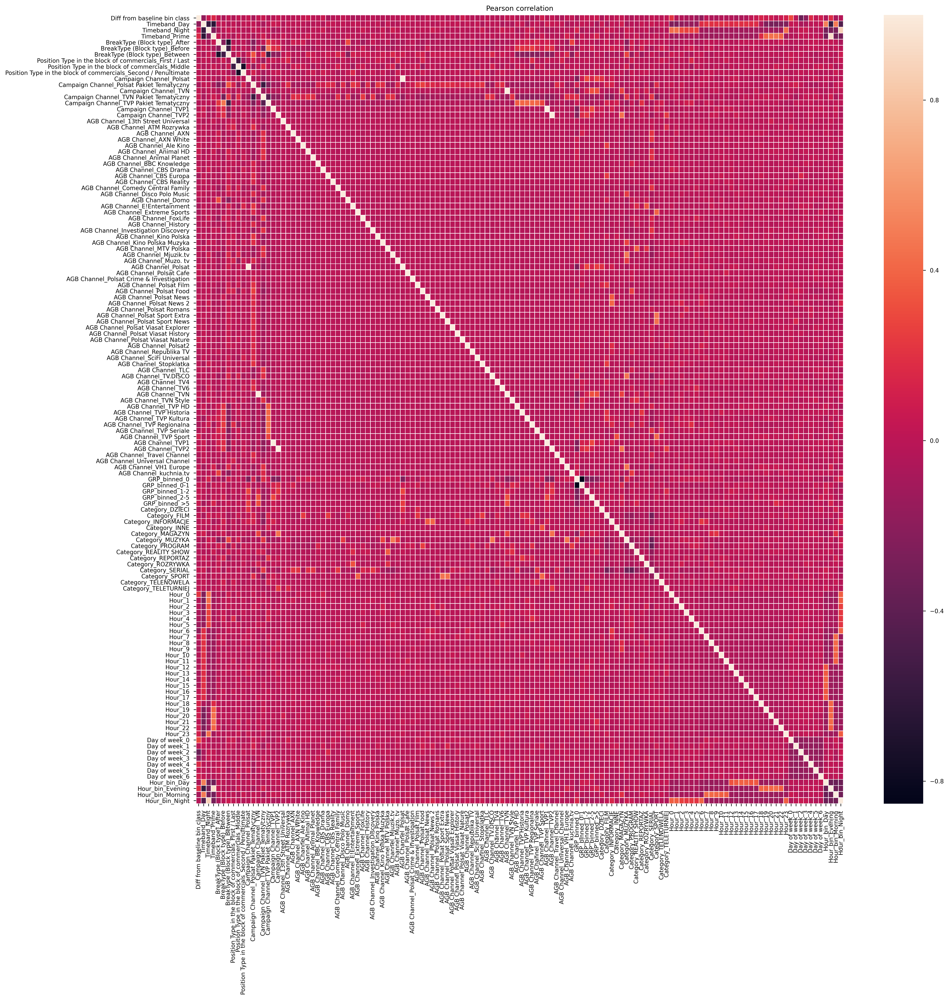

In [87]:
plt.rcParams['figure.figsize'] =  (20, 20)
corr = data.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, linewidths=.5)
plt.title('Pearson correlation')

plt.show()

### Model

I decided to change initial regression task (target - `Diff from baseline`) into multiclass classification problem (target - `Diff from baseline bin class`) due to small number of samples and high number of features. However in this classification approach we have imbalanced classess which means that we can not rely on every classification metric. For scoring the model I chose `f1_score_macro` which will consider both `precision` and `recall` metrics.

In [89]:
train = data[(data.Date>='2014-11-10') & (data.Date<='2014-11-20')].copy()
test = data[(data.Date>'2014-11-20')].copy()

In [90]:
if 'Date' in train.columns: train.drop('Date', axis=1, inplace=True)
if 'Date' in test.columns: test.drop('Date', axis=1, inplace=True)

In [91]:
X_train = train.drop(['Diff from baseline bin class'], axis=1)
y_train = train['Diff from baseline bin class']
X_test = test.drop(['Diff from baseline bin class'], axis=1)
y_test = test['Diff from baseline bin class']

#### Basline logistic regression

In [92]:
from sklearn.linear_model import LogisticRegression
logistic = LogisticRegression(multi_class='ovr')
logistic.fit(X_train, y_train)

LogisticRegression(multi_class='ovr')

In [93]:
y_pred_logistic = logistic.predict(X_test)

##### Evaluation

In [183]:
from sklearn.metrics import accuracy_score, f1_score, classification_report

logistic_accuracy_train = classification_report(y_train, logistic.predict(X_train))
print(logistic_accuracy_train)

              precision    recall  f1-score   support

           0       0.77      0.78      0.77       562
           1       0.75      0.88      0.81      1012
           2       0.66      0.17      0.27       197
           3       1.00      0.48      0.65        69

    accuracy                           0.76      1840
   macro avg       0.79      0.58      0.62      1840
weighted avg       0.76      0.76      0.73      1840



In [182]:
logistic_accuracy_test = classification_report(y_test, y_pred_logistic)
print(logistic_accuracy_test)

              precision    recall  f1-score   support

           0       0.80      0.19      0.30        64
           1       0.75      0.98      0.85       250
           2       0.48      0.23      0.31        44
           3       1.00      0.56      0.71         9

    accuracy                           0.74       367
   macro avg       0.76      0.49      0.54       367
weighted avg       0.73      0.74      0.69       367



In [176]:
logistic_importance = logistic.coef_

In [157]:
logistic_importance_df = pd.DataFrame() 
logistic_importance_df['Columns'] = X_train.columns
logistic_importance_df['Importance > 100'] = pd.Series(logistic_importance[diff_class['>100']])  
logistic_importance_df = logistic_importance_df.sort_values(by='Importance > 100', ascending=False)
print(logistic_importance_df[:10])

                       Columns  Importance > 100
118              Day of week_0          3.761231
94                      Hour_0          3.760794
119              Day of week_1          1.580287
126           Hour_bin_Evening          1.322710
62       AGB Channel_TVN Style          1.018653
1               Timeband_Night          0.990940
46   AGB Channel_Polsat News 2          0.634117
63          AGB Channel_TVP HD          0.625301
68       AGB Channel_TVP Sport          0.594554
128             Hour_bin_Night          0.579289


#### XGBoost

In [260]:
from sklearn.multiclass import OneVsRestClassifier
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold, GridSearchCV

In [261]:
from sklearn.metrics import make_scorer

f1 = make_scorer(f1_score , average='macro')

In [270]:
xgb_model = OneVsRestClassifier(xgb.XGBClassifier(class_weight='balanced'))

I run `GridSearchCV` to optimize the XGBoost model with best parameters. I use also `StratifiedKFold` to have the same proportion of observation in each fold.

In [239]:
kfold = StratifiedKFold(n_splits=3, random_state=42)

param_grid = { 
    'estimator__colsample_bytree':[.75,1],
    'estimator__learning_rate':[0.1,0.3,0.5],
    'estimator__max_depth':[3,5],
    'estimator__subsample':[.75,1],
    'estimator__n_estimators': list(range(100, 400, 100))
}

In [240]:
grid_search = GridSearchCV(estimator=xgb_model, scoring=f1, param_grid=param_grid, n_jobs=-1, cv=kfold, verbose=1)
grid_result = grid_search.fit(X_train, y_train)

print(f'Best: {grid_result.best_score_} using {grid_result.best_params_}','\n')

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 14.5min finished


Best: 0.19109417472744883 using {'estimator__colsample_bytree': 0.75, 'estimator__learning_rate': 0.5, 'estimator__max_depth': 3, 'estimator__n_estimators': 300, 'estimator__subsample': 1} 



In [276]:
xgb_model_best = OneVsRestClassifier(xgb.XGBClassifier(class_weight='balanced', colsample_bytree=0.75, learning_rate=0.5,
                                                 max_depth=3, n_estimators=30, subsample=1))

In [277]:
xgb_model_best.fit(X_train, y_train)

OneVsRestClassifier(estimator=XGBClassifier(class_weight='balanced',
                                            colsample_bytree=0.75,
                                            learning_rate=0.5,
                                            n_estimators=30))

In [278]:
xgb_pred=xgb_model_best.predict(X_test)

#### Evaluation

In [279]:
print(classification_report(y_train, xgb_model_best.predict(X_train)))

              precision    recall  f1-score   support

           0       0.77      0.91      0.83       562
           1       0.86      0.88      0.87      1012
           2       0.99      0.46      0.63       197
           3       0.93      0.80      0.86        69

    accuracy                           0.84      1840
   macro avg       0.89      0.76      0.80      1840
weighted avg       0.85      0.84      0.83      1840



In [280]:
print(classification_report(y_test, xgb_pred))

              precision    recall  f1-score   support

           0       1.00      0.33      0.49        64
           1       0.83      0.96      0.89       250
           2       0.81      0.98      0.89        44
           3       1.00      0.56      0.71         9

    accuracy                           0.84       367
   macro avg       0.91      0.71      0.75       367
weighted avg       0.86      0.84      0.82       367



The model predicts each class with a different `f1_score`. The most stable results are for `Class 1`. `Class 0` and `Class 3` are much better on train sample and worse on test. `Class 2` is better on test set. 

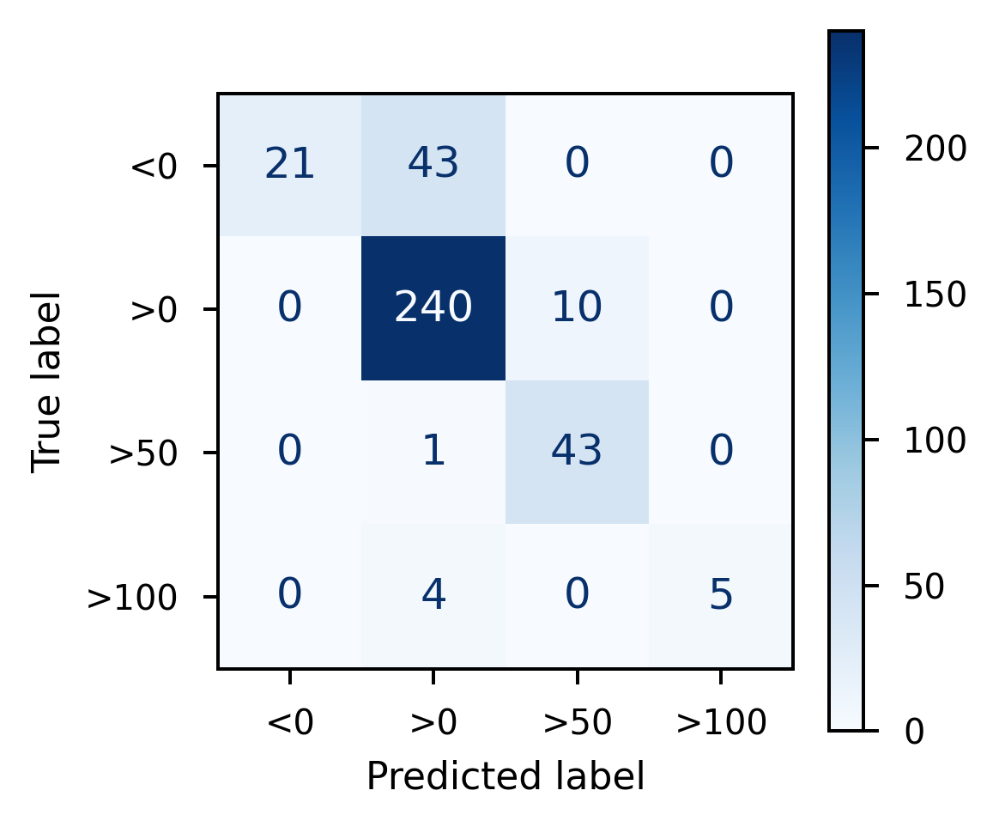

In [287]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

plt.rcParams['figure.figsize'] =  (3, 3)
labels = diff_class.keys()
plot_confusion_matrix(xgb_model, X_test, y_test, display_labels=labels,
                                 cmap=plt.cm.Blues)
plt.show()

In [281]:
xgb_importance = xgb_model.estimators_
xgb_importance

[XGBClassifier(class_weight='balanced', colsample_bytree=0.75, learning_rate=0.5,
               n_estimators=30),
 XGBClassifier(class_weight='balanced', colsample_bytree=0.75, learning_rate=0.5,
               n_estimators=30),
 XGBClassifier(class_weight='balanced', colsample_bytree=0.75, learning_rate=0.5,
               n_estimators=30),
 XGBClassifier(class_weight='balanced', colsample_bytree=0.75, learning_rate=0.5,
               n_estimators=30)]

### Model explanation

In [282]:
import eli5

The most important features for TV spots having more than 100% impact on website visits are:

In [283]:
eli5.explain_weights_xgboost(xgb_importance[diff_class['>100']], feature_names=X_train.columns.values, top=10)

Weight,Feature
0.1471,Timeband_Day
0.1207,Day of week_0
0.1096,Day of week_1
0.1050,Hour_bin_Evening
0.0898,Hour_0
0.0532,Day of week_3
0.0514,AGB Channel_TVP Sport
0.0467,Day of week_2
0.0413,Hour_23
0.0237,Campaign Channel_Polsat Pakiet Tematyczny


The most important features for TV spots having more than 50% impact on website visits are:

In [284]:
eli5.explain_weights_xgboost(xgb_importance[diff_class['>50']], feature_names=X_train.columns.values, top=10)

Weight,Feature
0.1957,Hour_bin_Evening
0.0986,Timeband_Prime
0.0461,Hour_7
0.0420,Hour_bin_Night
0.0404,Day of week_3
0.0382,AGB Channel_Animal HD
0.0381,Day of week_4
0.0343,Day of week_6
0.0335,Day of week_2
0.0265,Hour_8


The most important features for TV spots having positive impact on website visits are:

In [285]:
eli5.explain_weights_xgboost(xgb_importance[diff_class['>0']], feature_names=X_train.columns.values, top=10, importance_type='weight')

Weight,Feature
0.0800,Day of week_0
0.0571,Day of week_2
0.0571,Day of week_1
0.0514,Day of week_5
0.0400,Day of week_6
0.0343,Hour_8
0.0343,Hour_17
0.0286,Hour_6
0.0286,Hour_0
0.0286,Hour_18


In [286]:
eli5.explain_weights_xgboost(xgb_importance[diff_class['<0']], feature_names=X_train.columns.values, top=10, importance_type='weight')

Weight,Feature
0.0604,Day of week_2
0.0537,Day of week_4
0.0537,Day of week_5
0.0470,Day of week_6
0.0470,Day of week_0
0.0470,Hour_17
0.0403,Hour_bin_Day
0.0403,Hour_18
0.0403,Day of week_3
0.0403,Day of week_1
